# Import Dependencies

In [1]:
import json
import urllib
import urllib.request
from urllib.parse import urlparse
import httplib2 as http  # external library
import pandas as pd
# from datetime import datetime, timezone
import shutil
import schedule
import time
import random
from ultralytics import YOLO
from ultralytics.utils.plotting import Annotator
import os
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
import ast

# Test using pre-trained YOLOv8 nano model

In [2]:
model = YOLO("yolov8n.pt")

In [3]:
def xyxy_to_xywh(*xyxy):
    """" Calculates the relative bounding box from absolute pixel values. """
    bbox_left = min([xyxy[0].item(), xyxy[2].item()])
    bbox_top = min([xyxy[1].item(), xyxy[3].item()])
    bbox_w = abs(xyxy[0].item() - xyxy[2].item())
    bbox_h = abs(xyxy[1].item() - xyxy[3].item())
    x_c = (bbox_left + bbox_w / 2)
    y_c = (bbox_top + bbox_h / 2)
    w = bbox_w
    h = bbox_h
    return x_c, y_c, w, h


0: 480x640 (no detections), 101.5ms
Speed: 8.0ms preprocess, 101.5ms inference, 91.0ms postprocess per image at shape (1, 3, 480, 640)


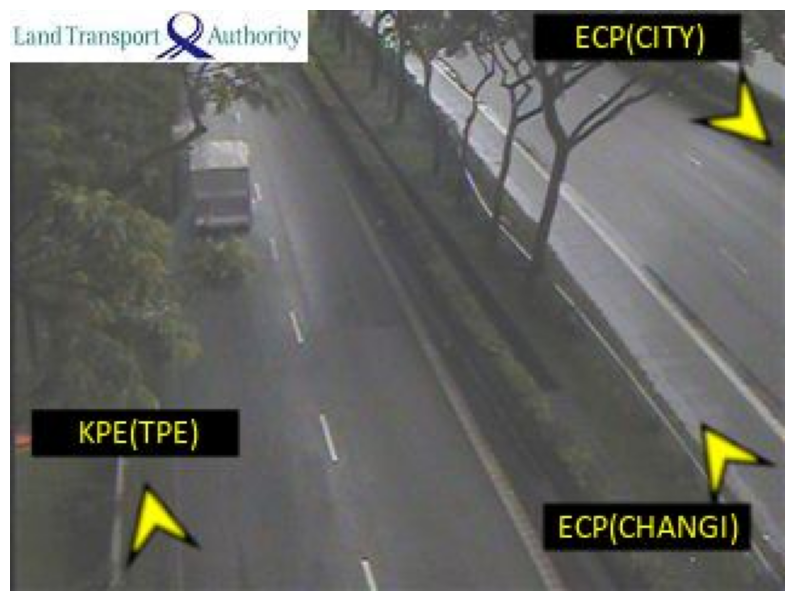


0: 480x640 1 car, 9.0ms
Speed: 1.0ms preprocess, 9.0ms inference, 192.5ms postprocess per image at shape (1, 3, 480, 640)


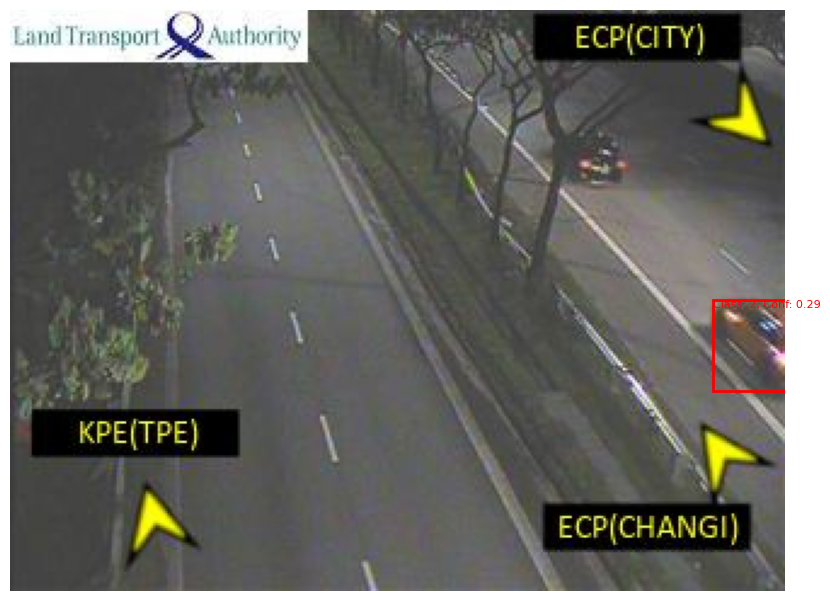


0: 480x640 3 cars, 8.0ms
Speed: 1.0ms preprocess, 8.0ms inference, 3.0ms postprocess per image at shape (1, 3, 480, 640)


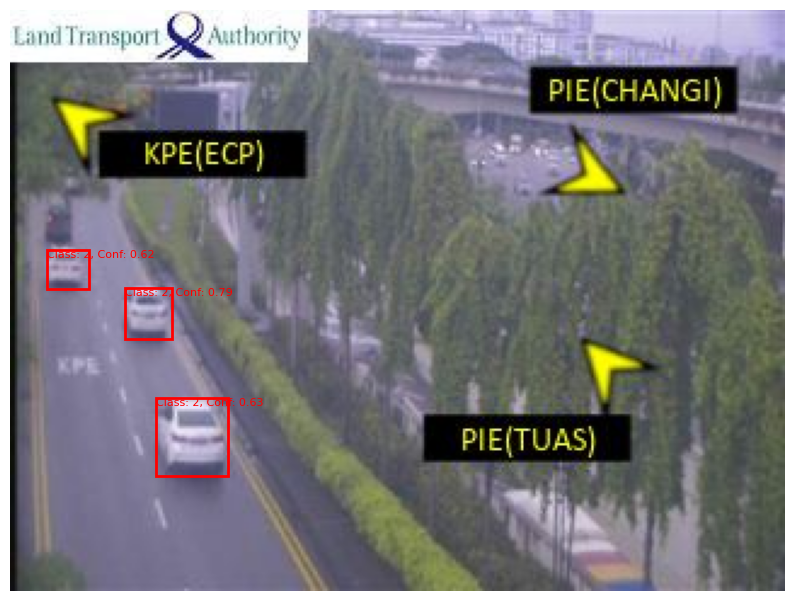


0: 480x640 (no detections), 7.0ms
Speed: 1.0ms preprocess, 7.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


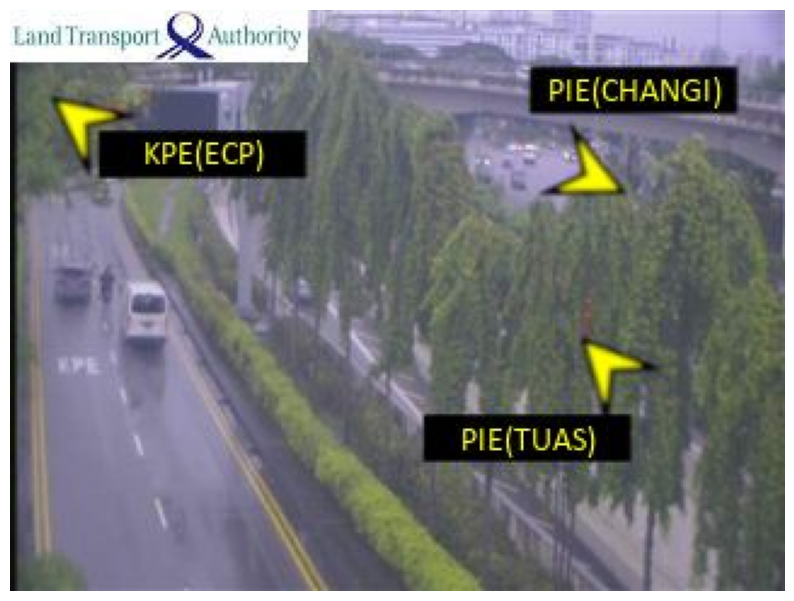


0: 480x640 1 car, 8.0ms
Speed: 1.0ms preprocess, 8.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


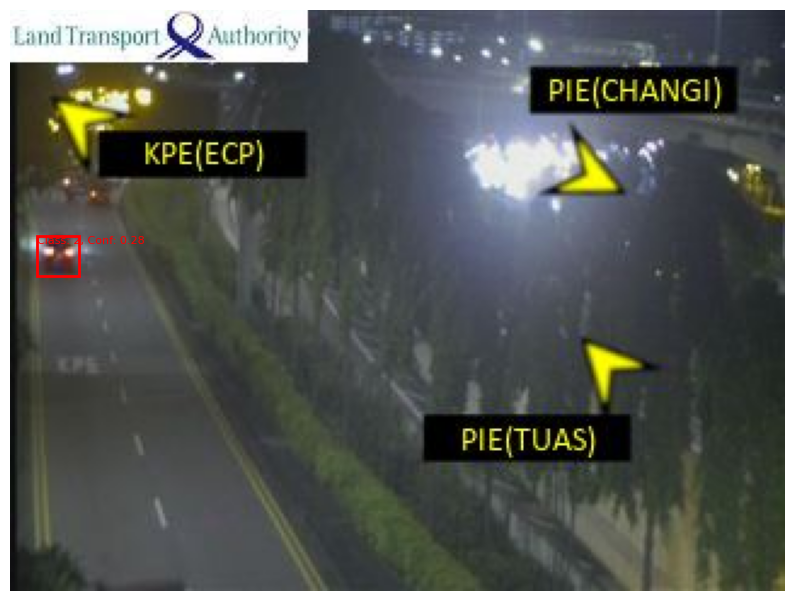


0: 480x640 (no detections), 8.0ms
Speed: 1.0ms preprocess, 8.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


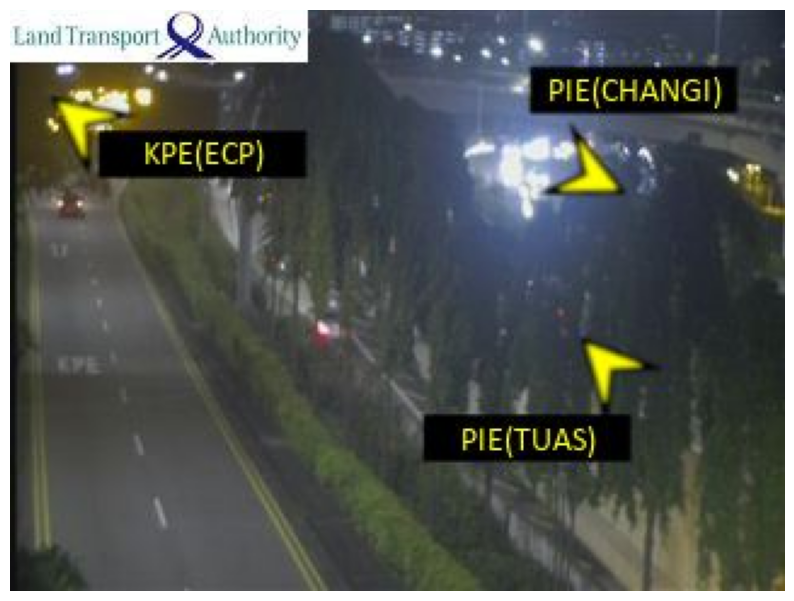


0: 480x640 1 car, 8.0ms
Speed: 1.0ms preprocess, 8.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


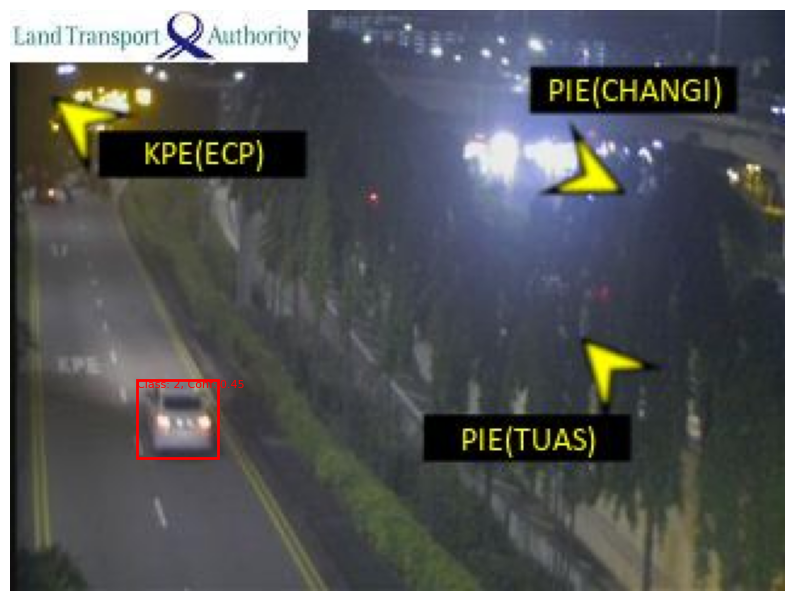


0: 480x640 2 cars, 10.0ms
Speed: 1.0ms preprocess, 10.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


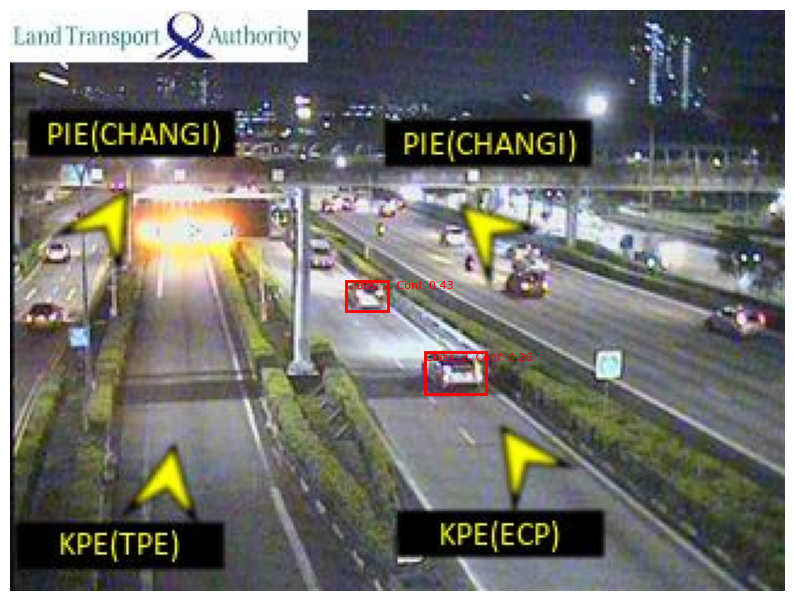


0: 480x640 (no detections), 8.0ms
Speed: 0.0ms preprocess, 8.0ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


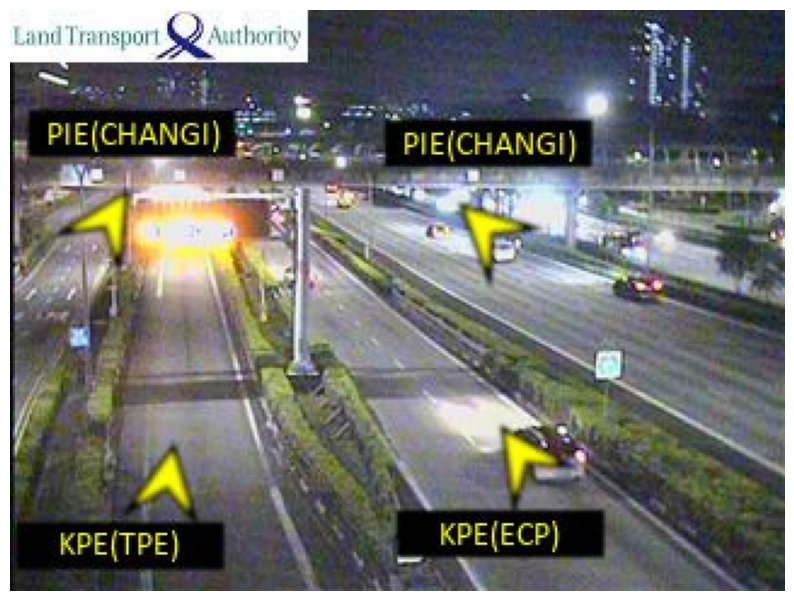


0: 480x640 6 cars, 7.0ms
Speed: 1.0ms preprocess, 7.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


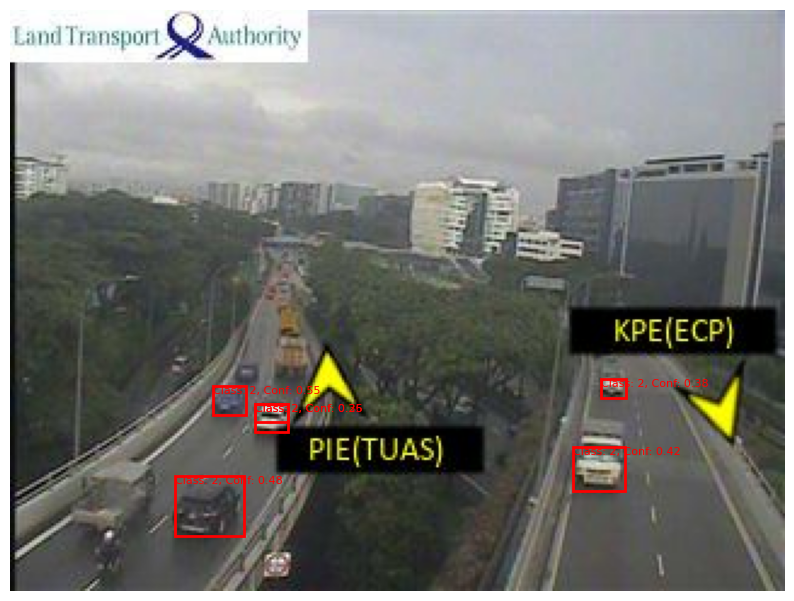

In [4]:
# Directory of images
image_dir = r"C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\images\test"

# Get list of image files
image_files = [file for file in os.listdir(image_dir) if file.endswith(".jpg") or file.endswith(".png")]

# Predict and plot bounding boxes for each image
for image_file in image_files[:10]:
    # Read image
    image_path = os.path.join(image_dir, image_file)
    image = cv2.imread(image_path)

    # Perform object detection
    results = model(image)

    # Create a single figure for each image
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    for result in results:
        # Get bounding box coordinates and class labels
        boxes = result.boxes.xywh.cpu().numpy()
        class_labels = result.boxes.cls.cpu().numpy().astype(int)
        conf_scores = result.boxes.conf.cpu().numpy()

        for box, class_label, conf_score in zip(boxes, class_labels, conf_scores):
            x, y, w, h = box[0], box[1], box[2], box[3]
            label = f"Class: {class_label}, Conf: {conf_score:.2f}"
            
            # Draw bounding box on the image
            rectangle = Rectangle((x-w/2, y-h/2), w, h, linewidth=2, edgecolor='r', facecolor='none')
            plt.gca().add_patch(rectangle)
            plt.text(x - w/2, y - h/2, label, fontsize=8, color='r', verticalalignment='top')

    # Show image with all bounding boxes
    plt.show()

# Model training

## Data split

In [12]:
# Define the directories for the original dataset and the output directories for train, val, and test sets
original_images_dir = r"C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\raw\images"
original_labels_dir = r"C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\raw\labels"

train_img_dir = r"C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\images\train"
val_img_dir = r"C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\images\val"
test_img_dir = r"C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\images\test"

train_label_dir = r"C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\labels\train"
val_label_dir = r"C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\labels\val"
test_label_dir = r"C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\labels\test"

# Define the train, validation, and test ratios
train_ratio = 0.7
val_ratio = 0.2
test_ratio = 0.1

# Create output directories if they don't exist
os.makedirs(train_img_dir, exist_ok=True)
os.makedirs(val_img_dir, exist_ok=True)
os.makedirs(test_img_dir, exist_ok=True)
os.makedirs(train_label_dir, exist_ok=True)
os.makedirs(val_label_dir, exist_ok=True)
os.makedirs(test_label_dir, exist_ok=True)

# List all files in the original dataset directory
files = os.listdir(original_images_dir)
random.shuffle(files)  # Shuffle the files randomly

# Split the files into train, validation, and test sets
num_files = len(files)
num_train = int(num_files * train_ratio)
num_val = int(num_files * val_ratio)
train_files = files[:num_train]
val_files = files[num_train:num_train + num_val]
test_files = files[num_train + num_val:]

# Function to copy files from source directory to destination directory
def copy_files(files, img_dir, label_dir, dest_img_dir, dest_label_dir):
    for file in files:
        # Copy image
        shutil.copy(os.path.join(img_dir, file), dest_img_dir)
        # Copy corresponding txt file
        txt_file = os.path.splitext(file)[0] + ".txt"
        shutil.copy(os.path.join(label_dir, txt_file), dest_label_dir)

# Copy files to train directory
copy_files(train_files, original_images_dir, original_labels_dir, train_img_dir, train_label_dir)

# Copy files to validation directory
copy_files(val_files, original_images_dir, original_labels_dir, val_img_dir, val_label_dir)

# Copy files to test directory
copy_files(test_files, original_images_dir, original_labels_dir, test_img_dir, test_label_dir)

print("Dataset split and copied successfully.")

Dataset split and copied successfully.


In [4]:
model = YOLO("yolov8n.pt")

In [5]:
model.tune(data="C:\\Users\\User\\Desktop\\DSO\\traffic-prediction\\backend\\data\\vehicles.yaml", epochs=100, iterations=300, device=0) # train the model

Tuner: Initialized Tuner instance with 'tune_dir=C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\tune3'
Tuner: 💡 Learn about tuning at https://docs.ultralytics.com/guides/hyperparameter-tuning
Tuner: Starting iteration 1/300 with hyperparameters: {'lr0': 0.01, 'lrf': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'box': 7.5, 'cls': 0.5, 'dfl': 1.5, 'hsv_h': 0.015, 'hsv_s': 0.7, 'hsv_v': 0.4, 'degrees': 0.0, 'translate': 0.1, 'scale': 0.5, 'shear': 0.0, 'perspective': 0.0, 'flipud': 0.0, 'fliplr': 0.5, 'mosaic': 1.0, 'mixup': 0.0, 'copy_paste': 0.0}
Saved C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\tune3\tune_scatter_plots.png
Saved C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\tune3\tune_fitness.png

Tuner: 1/300 iterations complete ✅ (615.52s)
Tuner: Results saved to C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\tune3
Tuner: Best f

In [6]:
results = model.train(data=os.path.join('..', 'data', 'vehicles.yaml'), epochs=1000, patience=50, device=0, cfg=os.path.join('..', 'results', 'runs', 'detect', 'tune3', 'best_hyperparameters.yaml')) # train the model

New https://pypi.org/project/ultralytics/8.1.7 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.5 🚀 Python-3.11.6 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 3070 Ti, 8192MiB)
engine\trainer: task=detect, mode=train, model=None, data=..\data\vehicles.yaml, epochs=1000, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train24, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save

  8                  -1  1    460288  ultralytics.nn.modules.block.C2f             [256, 256, 1, True]           
  9                  -1  1    164608  ultralytics.nn.modules.block.SPPF            [256, 256, 5]                 
 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 12                  -1  1    148224  ultralytics.nn.modules.block.C2f             [384, 128, 1]                 
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  1     37248  ultralytics.nn.modules.block.C2f             [192, 64, 1]                  
 16                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 

train: Scanning C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\labels\train.cache... 564 images, 0 backgrounds, 0 corrupt: 100%|██████████| 564/564 [00:00<?, ?it/s]
val: Scanning C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\labels\val.cache... 161 images, 0 backgrounds, 0 corrupt: 100%|██████████| 161/161 [00:00<?, ?it/s]


Plotting labels to C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train24\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01021' and 'momentum=0.86007' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.00045), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train24
Starting training for 1000 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     1/1000      2.71G      2.738      3.764      1.811         27        640: 100%|██████████| 36/36 [00:07<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  4.74it/s]

                   all        161       1740    0.00107       0.02    0.00448    0.00242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     2/1000      2.71G      2.128      2.225      1.275         65        640: 100%|██████████| 36/36 [00:04<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.40it/s]

                   all        161       1740      0.641      0.116      0.104     0.0429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     3/1000      2.91G      1.868       1.81      1.137        109        640: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.21it/s]

                   all        161       1740      0.442      0.269      0.234       0.12



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     4/1000      2.87G      1.745      1.649      1.079        114        640: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.44it/s]

                   all        161       1740      0.386      0.321      0.279      0.148



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     5/1000      2.92G      1.652       1.52      1.042         63        640: 100%|██████████| 36/36 [00:03<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.35it/s]

                   all        161       1740      0.394      0.323      0.302      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     6/1000      3.09G      1.644      1.407      1.023         98        640: 100%|██████████| 36/36 [00:03<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.64it/s]

                   all        161       1740      0.388      0.331      0.331      0.165



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     7/1000      2.66G      1.584      1.352      1.016        115        640: 100%|██████████| 36/36 [00:03<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.67it/s]

                   all        161       1740      0.504      0.412      0.385      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     8/1000      3.05G      1.538      1.284     0.9926         53        640: 100%|██████████| 36/36 [00:03<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.65it/s]

                   all        161       1740      0.529        0.4       0.42       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     9/1000      2.67G      1.519      1.266     0.9887         88        640: 100%|██████████| 36/36 [00:03<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.06it/s]

                   all        161       1740      0.525      0.386      0.399      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    10/1000      2.83G      1.519       1.25     0.9826         67        640: 100%|██████████| 36/36 [00:03<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.07it/s]


                   all        161       1740      0.506      0.443      0.433      0.233

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    11/1000      2.93G      1.478      1.184     0.9775         62        640: 100%|██████████| 36/36 [00:03<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.76it/s]

                   all        161       1740       0.55      0.437      0.452      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    12/1000      3.05G      1.481      1.162      0.977        165        640: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.85it/s]


                   all        161       1740      0.597       0.42      0.453      0.248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    13/1000      3.06G      1.468       1.16     0.9696         47        640: 100%|██████████| 36/36 [00:03<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.79it/s]

                   all        161       1740      0.593      0.479      0.498      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    14/1000      2.73G      1.459      1.118     0.9663         53        640: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.00it/s]


                   all        161       1740      0.527      0.468      0.456      0.237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    15/1000       2.7G      1.459       1.13     0.9698         19        640: 100%|██████████| 36/36 [00:03<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.95it/s]

                   all        161       1740      0.559      0.472      0.484      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    16/1000      3.11G       1.43      1.075     0.9554         92        640: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.07it/s]


                   all        161       1740      0.535      0.493      0.494       0.27

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    17/1000      3.07G      1.404      1.047     0.9445        101        640: 100%|██████████| 36/36 [00:03<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.96it/s]

                   all        161       1740      0.535       0.52      0.495      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    18/1000      2.71G        1.4      1.043     0.9478         45        640: 100%|██████████| 36/36 [00:03<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.92it/s]

                   all        161       1740      0.577      0.499      0.521      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    19/1000      2.89G      1.383      1.024     0.9481         35        640: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.09it/s]


                   all        161       1740      0.593      0.524      0.534      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    20/1000      2.88G      1.391      1.003     0.9477         98        640: 100%|██████████| 36/36 [00:03<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.92it/s]

                   all        161       1740       0.63       0.53      0.546      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    21/1000      2.97G      1.351     0.9686     0.9328         26        640: 100%|██████████| 36/36 [00:03<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.12it/s]


                   all        161       1740      0.574      0.544      0.535      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    22/1000      2.74G      1.387     0.9879     0.9431         51        640: 100%|██████████| 36/36 [00:03<00:00,  9.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.14it/s]

                   all        161       1740      0.601      0.506      0.541       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    23/1000      3.03G      1.354      0.984     0.9395        115        640: 100%|██████████| 36/36 [00:03<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.71it/s]

                   all        161       1740      0.606       0.47      0.513      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    24/1000      3.18G      1.366     0.9615     0.9362        108        640: 100%|██████████| 36/36 [00:03<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.85it/s]

                   all        161       1740      0.529      0.577      0.558      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    25/1000      2.95G      1.339     0.9407     0.9289        113        640: 100%|██████████| 36/36 [00:03<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.22it/s]

                   all        161       1740      0.587      0.525      0.559      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    26/1000      2.93G      1.351     0.9457     0.9289         62        640: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.12it/s]

                   all        161       1740      0.577      0.546      0.553      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    27/1000      3.15G      1.333     0.9157     0.9248         57        640: 100%|██████████| 36/36 [00:03<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.22it/s]

                   all        161       1740      0.611      0.524      0.561      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    28/1000      3.35G      1.331     0.8989     0.9262         37        640: 100%|██████████| 36/36 [00:03<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.09it/s]

                   all        161       1740      0.712      0.498      0.557      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    29/1000      2.69G      1.311      0.896     0.9245         62        640: 100%|██████████| 36/36 [00:03<00:00,  9.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.32it/s]

                   all        161       1740      0.632      0.541      0.575      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    30/1000      2.53G      1.327      0.919     0.9226         60        640: 100%|██████████| 36/36 [00:03<00:00,  9.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.93it/s]

                   all        161       1740      0.615      0.537      0.558      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    31/1000       2.9G      1.329     0.9032     0.9296         82        640: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.89it/s]

                   all        161       1740      0.661       0.52      0.573      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    32/1000      2.86G      1.322     0.8845     0.9298         60        640: 100%|██████████| 36/36 [00:03<00:00,  9.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.08it/s]

                   all        161       1740      0.607      0.514      0.559       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    33/1000      2.57G      1.315     0.8851     0.9247         98        640: 100%|██████████| 36/36 [00:03<00:00,  9.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.17it/s]

                   all        161       1740      0.623      0.522       0.58      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    34/1000      2.89G       1.33      0.891     0.9299         30        640: 100%|██████████| 36/36 [00:03<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.27it/s]

                   all        161       1740      0.656      0.533      0.599       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    35/1000      2.85G       1.29     0.8791     0.9215         20        640: 100%|██████████| 36/36 [00:03<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.32it/s]

                   all        161       1740      0.628      0.553       0.59      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    36/1000      2.65G      1.315     0.8895     0.9207         80        640: 100%|██████████| 36/36 [00:03<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.33it/s]

                   all        161       1740      0.666      0.534      0.594       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    37/1000      2.87G      1.312     0.8575     0.9128         78        640: 100%|██████████| 36/36 [00:03<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.23it/s]

                   all        161       1740      0.634      0.547      0.578      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    38/1000      2.97G      1.287     0.8497      0.911         68        640: 100%|██████████| 36/36 [00:03<00:00,  9.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.08it/s]

                   all        161       1740      0.653      0.537       0.59      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    39/1000      2.85G      1.293     0.8488     0.9192        137        640: 100%|██████████| 36/36 [00:03<00:00,  9.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.27it/s]


                   all        161       1740      0.703      0.493      0.589      0.346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    40/1000      2.82G      1.291     0.8502      0.917        135        640: 100%|██████████| 36/36 [00:03<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.51it/s]

                   all        161       1740      0.615      0.566      0.599      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    41/1000      3.04G       1.31     0.8514     0.9145         63        640: 100%|██████████| 36/36 [00:03<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.36it/s]

                   all        161       1740      0.612      0.593      0.594      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    42/1000      3.26G      1.269     0.8222     0.9076        139        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.48it/s]

                   all        161       1740      0.645      0.572      0.602      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    43/1000      2.78G       1.26      0.817     0.9051         78        640: 100%|██████████| 36/36 [00:03<00:00,  9.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.27it/s]

                   all        161       1740      0.646      0.564      0.603      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    44/1000      2.84G      1.256     0.8239     0.9103        102        640: 100%|██████████| 36/36 [00:03<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.80it/s]

                   all        161       1740      0.651      0.539      0.587      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    45/1000      2.94G      1.268     0.8166     0.9101        147        640: 100%|██████████| 36/36 [00:03<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.36it/s]

                   all        161       1740      0.706      0.532      0.616      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    46/1000       3.1G      1.272     0.8292      0.907        139        640: 100%|██████████| 36/36 [00:03<00:00,  9.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.12it/s]

                   all        161       1740      0.674      0.569      0.625      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    47/1000      3.04G      1.273     0.8201     0.9042        152        640: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.20it/s]

                   all        161       1740      0.674      0.542      0.613      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    48/1000      3.16G      1.249     0.8067     0.9035         51        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.26it/s]


                   all        161       1740      0.698       0.54       0.61      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    49/1000      2.82G      1.242     0.7904     0.9015         36        640: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.15it/s]

                   all        161       1740      0.631      0.565      0.616      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    50/1000      2.81G       1.24     0.7926     0.8985        117        640: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.52it/s]


                   all        161       1740      0.718      0.558      0.639      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    51/1000      2.86G      1.242      0.796     0.9055         78        640: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.32it/s]

                   all        161       1740      0.673      0.562      0.611      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    52/1000      3.06G      1.244     0.7956     0.9077        131        640: 100%|██████████| 36/36 [00:03<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.00it/s]

                   all        161       1740      0.658      0.579      0.617      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    53/1000      3.23G      1.237     0.7908     0.9027         79        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.38it/s]

                   all        161       1740      0.603      0.614      0.627      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    54/1000       3.4G      1.226     0.7763     0.9005        120        640: 100%|██████████| 36/36 [00:03<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.25it/s]

                   all        161       1740      0.688      0.591      0.637      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    55/1000      2.85G      1.216     0.7749     0.8954         98        640: 100%|██████████| 36/36 [00:03<00:00,  9.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.98it/s]

                   all        161       1740      0.671      0.526      0.599      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    56/1000      2.93G      1.232     0.7893     0.8987         70        640: 100%|██████████| 36/36 [00:03<00:00,  9.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.35it/s]

                   all        161       1740      0.654      0.564      0.618       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    57/1000      2.69G      1.216      0.771     0.8982         64        640: 100%|██████████| 36/36 [00:03<00:00,  9.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.49it/s]

                   all        161       1740      0.635      0.548      0.588      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    58/1000      3.34G      1.234     0.7938     0.8931         90        640: 100%|██████████| 36/36 [00:03<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.35it/s]


                   all        161       1740       0.65      0.523      0.587       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    59/1000      2.94G      1.234     0.7709     0.9016         76        640: 100%|██████████| 36/36 [00:03<00:00,  9.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.32it/s]

                   all        161       1740      0.663      0.544      0.611      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    60/1000      2.94G      1.209     0.7666     0.8945        125        640: 100%|██████████| 36/36 [00:03<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.47it/s]

                   all        161       1740      0.624      0.582      0.623      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    61/1000      2.56G      1.221     0.7598     0.8983         89        640: 100%|██████████| 36/36 [00:03<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.19it/s]


                   all        161       1740      0.579      0.581        0.6      0.359

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    62/1000      2.77G      1.213     0.7649     0.8985         94        640: 100%|██████████| 36/36 [00:03<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.15it/s]

                   all        161       1740      0.672      0.533      0.613      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    63/1000      3.15G      1.222     0.7615      0.894         54        640: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.59it/s]


                   all        161       1740      0.733      0.532      0.627      0.372

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    64/1000      3.51G      1.192     0.7473     0.8898         71        640: 100%|██████████| 36/36 [00:03<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.19it/s]

                   all        161       1740      0.677      0.575      0.617      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    65/1000      2.73G      1.231     0.7721     0.8944        158        640: 100%|██████████| 36/36 [00:03<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.13it/s]

                   all        161       1740      0.662      0.574      0.632      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    66/1000      2.81G      1.199     0.7531     0.8901         54        640: 100%|██████████| 36/36 [00:03<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.06it/s]

                   all        161       1740      0.649       0.57      0.626      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    67/1000      3.18G      1.223     0.7589     0.8889         65        640: 100%|██████████| 36/36 [00:03<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.29it/s]

                   all        161       1740      0.693      0.574      0.627      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    68/1000      2.61G      1.196      0.747     0.8932         75        640: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.33it/s]


                   all        161       1740      0.633      0.577      0.617      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    69/1000      3.23G      1.197     0.7422     0.8898        103        640: 100%|██████████| 36/36 [00:03<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.28it/s]

                   all        161       1740      0.582      0.588      0.598      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    70/1000      2.84G      1.201     0.7414     0.8939         95        640: 100%|██████████| 36/36 [00:03<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.45it/s]

                   all        161       1740      0.568      0.574      0.598      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    71/1000      2.93G      1.186     0.7352     0.8894        108        640: 100%|██████████| 36/36 [00:03<00:00,  9.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.03it/s]

                   all        161       1740      0.666      0.574      0.635       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    72/1000      3.17G      1.181     0.7333     0.8854         51        640: 100%|██████████| 36/36 [00:03<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.39it/s]

                   all        161       1740      0.619      0.567      0.601      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    73/1000      2.83G      1.184      0.737     0.8847        146        640: 100%|██████████| 36/36 [00:03<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.55it/s]

                   all        161       1740      0.673      0.535      0.613      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    74/1000      3.25G      1.193     0.7258     0.8901         82        640: 100%|██████████| 36/36 [00:03<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.46it/s]

                   all        161       1740      0.632      0.583      0.649      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    75/1000       2.8G      1.184     0.7228     0.8919        105        640: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.25it/s]

                   all        161       1740      0.638      0.551      0.613      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    76/1000      3.14G      1.207      0.752     0.8891         78        640: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.21it/s]

                   all        161       1740      0.718      0.507      0.613      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    77/1000      2.88G      1.197      0.742     0.8891         44        640: 100%|██████████| 36/36 [00:03<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.27it/s]


                   all        161       1740      0.682       0.54      0.601       0.35

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    78/1000      2.92G      1.175      0.713      0.887         32        640: 100%|██████████| 36/36 [00:03<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.43it/s]


                   all        161       1740      0.601      0.643      0.644      0.383

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    79/1000      2.87G      1.168     0.7185     0.8815         73        640: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.05it/s]

                   all        161       1740      0.575      0.637      0.645      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    80/1000       3.3G      1.184     0.7221     0.8869         65        640: 100%|██████████| 36/36 [00:03<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.34it/s]

                   all        161       1740      0.636      0.568      0.616      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    81/1000       2.8G       1.16     0.7103     0.8823         43        640: 100%|██████████| 36/36 [00:03<00:00,  9.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.24it/s]

                   all        161       1740      0.674      0.588      0.636      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    82/1000      2.75G      1.165     0.7036     0.8869         92        640: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.40it/s]

                   all        161       1740      0.628      0.544      0.601      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    83/1000      3.07G      1.175     0.7258     0.8887         42        640: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.31it/s]

                   all        161       1740      0.674       0.55      0.621      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    84/1000      3.11G      1.155     0.7069     0.8809        137        640: 100%|██████████| 36/36 [00:03<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.40it/s]

                   all        161       1740      0.635      0.594      0.636      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    85/1000      2.72G      1.164     0.7069      0.878         68        640: 100%|██████████| 36/36 [00:03<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.16it/s]

                   all        161       1740      0.679      0.563      0.626      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    86/1000      3.53G      1.175     0.7119     0.8778        109        640: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.37it/s]


                   all        161       1740      0.653       0.59      0.646      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    87/1000      2.73G      1.151     0.6913     0.8789         82        640: 100%|██████████| 36/36 [00:03<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.44it/s]

                   all        161       1740        0.7      0.579      0.642      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    88/1000      3.23G      1.151     0.6845       0.88         94        640: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.45it/s]

                   all        161       1740      0.671      0.538      0.607      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    89/1000      2.65G      1.154     0.6964     0.8848         72        640: 100%|██████████| 36/36 [00:03<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.84it/s]

                   all        161       1740      0.714      0.527      0.618      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    90/1000      3.25G      1.165     0.7122     0.8837         53        640: 100%|██████████| 36/36 [00:03<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.07it/s]

                   all        161       1740      0.649      0.602      0.641      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    91/1000      2.91G      1.148     0.6924     0.8811         71        640: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.54it/s]

                   all        161       1740      0.637      0.577      0.608      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    92/1000      3.07G      1.133     0.6938     0.8745        111        640: 100%|██████████| 36/36 [00:03<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.45it/s]

                   all        161       1740       0.57      0.615      0.614      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    93/1000      2.49G      1.163     0.7032     0.8763        174        640: 100%|██████████| 36/36 [00:03<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.43it/s]

                   all        161       1740       0.71       0.54      0.614      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    94/1000      2.69G      1.132     0.6803     0.8733         56        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.34it/s]

                   all        161       1740      0.696      0.547      0.625      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    95/1000      3.28G      1.138     0.6718     0.8774        101        640: 100%|██████████| 36/36 [00:03<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.05it/s]

                   all        161       1740      0.695      0.539      0.609      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    96/1000       3.1G      1.149     0.6838     0.8767        155        640: 100%|██████████| 36/36 [00:03<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.28it/s]

                   all        161       1740      0.604      0.641      0.626      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    97/1000      2.63G      1.151     0.6925      0.874         95        640: 100%|██████████| 36/36 [00:03<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.20it/s]

                   all        161       1740      0.683      0.564      0.618      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    98/1000      2.89G       1.13     0.6855      0.875        105        640: 100%|██████████| 36/36 [00:03<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.41it/s]

                   all        161       1740       0.62      0.607      0.623      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    99/1000      2.97G      1.139     0.6915     0.8763         35        640: 100%|██████████| 36/36 [00:03<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.46it/s]

                   all        161       1740      0.646      0.583      0.613      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   100/1000      3.09G      1.146     0.6809     0.8779         40        640: 100%|██████████| 36/36 [00:03<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.40it/s]

                   all        161       1740      0.618      0.608      0.612      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   101/1000      3.02G      1.135      0.678     0.8776         98        640: 100%|██████████| 36/36 [00:03<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.03it/s]

                   all        161       1740      0.703      0.533      0.626      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   102/1000      2.92G      1.126      0.674     0.8734         78        640: 100%|██████████| 36/36 [00:03<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.28it/s]

                   all        161       1740      0.667      0.581      0.631      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   103/1000      2.72G      1.135     0.6747     0.8759        116        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.50it/s]


                   all        161       1740      0.586      0.617      0.638      0.383

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   104/1000      2.75G      1.133     0.6834     0.8738         43        640: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.50it/s]

                   all        161       1740      0.681      0.573      0.646       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   105/1000      3.12G      1.152     0.6816     0.8749         86        640: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.23it/s]

                   all        161       1740       0.67      0.592      0.639      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   106/1000      2.99G       1.11     0.6585     0.8685         67        640: 100%|██████████| 36/36 [00:03<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.31it/s]


                   all        161       1740      0.614      0.588       0.62      0.361

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   107/1000      3.54G      1.131     0.6824     0.8735         77        640: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.49it/s]

                   all        161       1740      0.623        0.6      0.615      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   108/1000      2.53G      1.133     0.6692     0.8709        126        640: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.36it/s]

                   all        161       1740       0.69      0.552      0.617      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   109/1000      3.22G      1.132     0.6749     0.8707        108        640: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.38it/s]

                   all        161       1740      0.587      0.594      0.627      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   110/1000      2.74G      1.115     0.6681     0.8705         37        640: 100%|██████████| 36/36 [00:03<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.91it/s]

                   all        161       1740      0.661      0.575      0.632      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   111/1000      2.89G      1.113     0.6584      0.877         76        640: 100%|██████████| 36/36 [00:03<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.22it/s]

                   all        161       1740      0.634      0.612      0.641      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   112/1000      3.11G      1.112     0.6661     0.8761         12        640: 100%|██████████| 36/36 [00:03<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.07it/s]

                   all        161       1740      0.649      0.585      0.636      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   113/1000      2.84G      1.115     0.6617     0.8738         90        640: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.33it/s]

                   all        161       1740      0.658      0.573      0.633      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   114/1000      3.07G       1.11       0.65     0.8709        131        640: 100%|██████████| 36/36 [00:03<00:00,  9.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.58it/s]

                   all        161       1740      0.642      0.586      0.631      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   115/1000      3.08G       1.09     0.6411     0.8693        125        640: 100%|██████████| 36/36 [00:03<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.07it/s]

                   all        161       1740      0.722      0.563      0.636      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   116/1000      2.57G      1.113     0.6576     0.8699        130        640: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.29it/s]

                   all        161       1740      0.708      0.576      0.639      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   117/1000      2.97G      1.137     0.6654     0.8687        108        640: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.44it/s]

                   all        161       1740      0.668      0.574      0.626      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   118/1000      3.17G      1.091     0.6624     0.8686         72        640: 100%|██████████| 36/36 [00:03<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.44it/s]

                   all        161       1740      0.706      0.548      0.625      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   119/1000      2.78G      1.102      0.651      0.872        121        640: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.19it/s]

                   all        161       1740      0.639      0.572       0.62      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   120/1000       2.7G      1.093     0.6471     0.8648         96        640: 100%|██████████| 36/36 [00:03<00:00,  9.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.11it/s]

                   all        161       1740      0.679      0.578      0.645      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   121/1000      2.79G      1.102     0.6651     0.8715         95        640: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.31it/s]

                   all        161       1740       0.64        0.6      0.626      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   122/1000      2.99G      1.109     0.6601     0.8743         79        640: 100%|██████████| 36/36 [00:03<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.30it/s]

                   all        161       1740      0.622      0.613      0.644      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   123/1000      3.19G      1.105     0.6653     0.8656         93        640: 100%|██████████| 36/36 [00:03<00:00,  9.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.35it/s]

                   all        161       1740      0.639       0.54      0.608      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   124/1000       2.7G      1.116     0.6677     0.8696         76        640: 100%|██████████| 36/36 [00:03<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.38it/s]

                   all        161       1740      0.665      0.558      0.619      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   125/1000      3.06G      1.112     0.6554     0.8722        103        640: 100%|██████████| 36/36 [00:03<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.12it/s]

                   all        161       1740      0.648      0.585      0.632      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   126/1000      2.95G      1.092     0.6394      0.864         81        640: 100%|██████████| 36/36 [00:03<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.44it/s]

                   all        161       1740      0.638      0.579       0.62      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   127/1000      3.04G      1.082     0.6349     0.8634        127        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.40it/s]


                   all        161       1740      0.616      0.581      0.624      0.377

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   128/1000      3.24G      1.097     0.6481      0.867         49        640: 100%|██████████| 36/36 [00:03<00:00,  9.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.43it/s]

                   all        161       1740      0.622      0.591      0.615      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   129/1000       2.6G        1.1     0.6456     0.8648         80        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.20it/s]

                   all        161       1740      0.636      0.568      0.628      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   130/1000      2.79G      1.087     0.6274     0.8634        154        640: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.43it/s]

                   all        161       1740      0.666      0.602      0.635      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   131/1000      2.56G      1.113     0.6471       0.87        135        640: 100%|██████████| 36/36 [00:03<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.26it/s]

                   all        161       1740      0.644      0.571      0.627      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   132/1000      2.68G      1.105     0.6448     0.8704        111        640: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.49it/s]

                   all        161       1740      0.668      0.595      0.635      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   133/1000      3.08G      1.081     0.6378     0.8626         79        640: 100%|██████████| 36/36 [00:03<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.42it/s]

                   all        161       1740      0.624      0.602      0.618      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   134/1000      2.75G      1.091     0.6471     0.8653         22        640: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.24it/s]


                   all        161       1740      0.628      0.605      0.623      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   135/1000      2.62G      1.074     0.6299     0.8624        149        640: 100%|██████████| 36/36 [00:03<00:00,  9.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.08it/s]

                   all        161       1740        0.6      0.567      0.602      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   136/1000      3.29G      1.071     0.6205     0.8588        110        640: 100%|██████████| 36/36 [00:03<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.40it/s]

                   all        161       1740      0.635      0.589       0.62      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   137/1000      2.95G       1.07     0.6311     0.8661         50        640: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.49it/s]

                   all        161       1740      0.702      0.573      0.636      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   138/1000       3.1G      1.082     0.6261     0.8664        123        640: 100%|██████████| 36/36 [00:03<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.53it/s]

                   all        161       1740       0.71      0.562      0.621      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   139/1000      2.91G      1.091     0.6311     0.8632        145        640: 100%|██████████| 36/36 [00:03<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.48it/s]

                   all        161       1740      0.634       0.59       0.63      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   140/1000      3.39G      1.064     0.6257     0.8619         46        640: 100%|██████████| 36/36 [00:03<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.52it/s]

                   all        161       1740       0.63      0.577      0.612      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   141/1000      3.04G      1.066     0.6147      0.862         72        640: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.39it/s]

                   all        161       1740      0.671       0.56      0.609      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   142/1000      2.84G      1.089     0.6293     0.8659         64        640: 100%|██████████| 36/36 [00:03<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.32it/s]

                   all        161       1740       0.68      0.574      0.613      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   143/1000      3.17G      1.079     0.6338     0.8621         76        640: 100%|██████████| 36/36 [00:03<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.48it/s]

                   all        161       1740      0.633      0.595      0.612      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   144/1000      2.86G      1.071     0.6372     0.8591        151        640: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.49it/s]


                   all        161       1740      0.665      0.562      0.627      0.381

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   145/1000      2.99G      1.068      0.629     0.8622        155        640: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.33it/s]

                   all        161       1740      0.649      0.577      0.623       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   146/1000      2.92G      1.058     0.6208     0.8643         49        640: 100%|██████████| 36/36 [00:03<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.53it/s]

                   all        161       1740      0.674      0.564      0.619      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   147/1000      2.98G      1.061     0.6202     0.8591         54        640: 100%|██████████| 36/36 [00:03<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.36it/s]

                   all        161       1740      0.661      0.589      0.641      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   148/1000      2.71G      1.073     0.6334     0.8601         94        640: 100%|██████████| 36/36 [00:03<00:00,  9.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.30it/s]

                   all        161       1740      0.642      0.599      0.624      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   149/1000      3.68G      1.063     0.6191     0.8558        138        640: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.09it/s]

                   all        161       1740      0.586      0.628      0.625      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   150/1000      3.21G      1.062     0.6237     0.8597        136        640: 100%|██████████| 36/36 [00:03<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.63it/s]

                   all        161       1740      0.689      0.565      0.628      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   151/1000      3.05G      1.028     0.6053     0.8608         30        640: 100%|██████████| 36/36 [00:03<00:00,  9.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.31it/s]


                   all        161       1740      0.682      0.566      0.634      0.381

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   152/1000      3.54G       1.07      0.619     0.8596        134        640: 100%|██████████| 36/36 [00:03<00:00,  9.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.60it/s]

                   all        161       1740      0.642       0.58       0.62       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   153/1000      3.04G      1.068     0.6198     0.8586         81        640: 100%|██████████| 36/36 [00:03<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.47it/s]


                   all        161       1740      0.687      0.583      0.636       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   154/1000      2.73G      1.068     0.6245     0.8578         99        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.50it/s]

                   all        161       1740      0.652      0.607       0.63      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   155/1000      2.48G      1.041     0.6128     0.8532         71        640: 100%|██████████| 36/36 [00:03<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.50it/s]


                   all        161       1740      0.685       0.57      0.629      0.388

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   156/1000      2.99G       1.06     0.6151     0.8561        150        640: 100%|██████████| 36/36 [00:03<00:00,  9.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.12it/s]

                   all        161       1740      0.685      0.585      0.627      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   157/1000      3.34G      1.067     0.6165     0.8586         49        640: 100%|██████████| 36/36 [00:03<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.36it/s]

                   all        161       1740      0.613      0.604      0.642       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   158/1000      2.84G      1.041     0.5988     0.8563         90        640: 100%|██████████| 36/36 [00:03<00:00,  9.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.43it/s]

                   all        161       1740      0.683      0.598      0.651      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   159/1000      2.88G      1.056     0.6077     0.8616         68        640: 100%|██████████| 36/36 [00:03<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.41it/s]

                   all        161       1740      0.672      0.592       0.64      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   160/1000      3.21G      1.056     0.6085     0.8574         34        640: 100%|██████████| 36/36 [00:03<00:00,  9.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.62it/s]

                   all        161       1740      0.705       0.53      0.621      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   161/1000       3.4G      1.043     0.5961     0.8598         29        640: 100%|██████████| 36/36 [00:03<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.33it/s]

                   all        161       1740      0.662      0.578      0.627      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   162/1000      3.21G      1.051     0.6075     0.8623         64        640: 100%|██████████| 36/36 [00:03<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.36it/s]

                   all        161       1740      0.675      0.578      0.622      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   163/1000      2.84G      1.043     0.5948     0.8578        121        640: 100%|██████████| 36/36 [00:03<00:00,  9.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.56it/s]


                   all        161       1740      0.667      0.561      0.634      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   164/1000      2.82G      1.044     0.6029     0.8544        156        640: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.56it/s]


                   all        161       1740      0.749      0.552      0.653      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   165/1000       3.4G       1.04     0.5984     0.8523         76        640: 100%|██████████| 36/36 [00:03<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.49it/s]

                   all        161       1740      0.635      0.595      0.642       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   166/1000      3.08G      1.016     0.5815      0.853         36        640: 100%|██████████| 36/36 [00:03<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.54it/s]

                   all        161       1740      0.632      0.597      0.639      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   167/1000      2.71G      1.032     0.5934     0.8582         38        640: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.36it/s]

                   all        161       1740      0.635      0.599      0.633      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   168/1000      2.75G      1.041     0.6047     0.8523         61        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.34it/s]

                   all        161       1740      0.666      0.558      0.614      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   169/1000      3.14G      1.031     0.5938     0.8524         52        640: 100%|██████████| 36/36 [00:03<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.47it/s]

                   all        161       1740      0.615      0.569      0.606      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   170/1000      2.57G      1.047     0.6052      0.856        127        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.72it/s]


                   all        161       1740      0.647      0.545      0.602      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   171/1000      3.55G      1.041     0.5957     0.8511         79        640: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.38it/s]

                   all        161       1740      0.662      0.578      0.628       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   172/1000      2.88G      1.042     0.6001     0.8577         62        640: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.30it/s]

                   all        161       1740      0.702      0.548      0.626      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   173/1000      2.99G      1.016     0.5876     0.8508         57        640: 100%|██████████| 36/36 [00:03<00:00,  9.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.39it/s]

                   all        161       1740      0.666      0.585      0.628      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   174/1000      2.89G      1.017       0.59     0.8528         64        640: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.35it/s]

                   all        161       1740      0.689      0.586      0.636      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   175/1000      3.09G      1.016     0.5911     0.8495         49        640: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.49it/s]

                   all        161       1740      0.685      0.579      0.626       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   176/1000      2.77G      1.033     0.5971     0.8535         69        640: 100%|██████████| 36/36 [00:03<00:00,  9.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.59it/s]

                   all        161       1740      0.681      0.548      0.615      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   177/1000       2.9G      1.013     0.5828     0.8501        102        640: 100%|██████████| 36/36 [00:03<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.47it/s]

                   all        161       1740       0.68      0.562      0.623       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   178/1000      2.87G      1.032     0.5863     0.8478         94        640: 100%|██████████| 36/36 [00:03<00:00,  9.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.36it/s]

                   all        161       1740      0.677      0.579      0.616      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   179/1000       3.4G      1.048     0.6067     0.8577         91        640: 100%|██████████| 36/36 [00:03<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.33it/s]

                   all        161       1740      0.695      0.565      0.627      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   180/1000      2.69G      1.018     0.5944     0.8566         50        640: 100%|██████████| 36/36 [00:03<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.47it/s]

                   all        161       1740      0.617      0.584      0.623      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   181/1000      2.52G      1.012     0.5836     0.8498         82        640: 100%|██████████| 36/36 [00:03<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.45it/s]

                   all        161       1740      0.652      0.629      0.643      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   182/1000      2.93G      1.016     0.5843     0.8532         65        640: 100%|██████████| 36/36 [00:03<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.30it/s]

                   all        161       1740      0.656      0.606      0.648      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   183/1000      3.09G      1.034     0.5881     0.8508         41        640: 100%|██████████| 36/36 [00:03<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.42it/s]


                   all        161       1740      0.654      0.576      0.613       0.36

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   184/1000      3.23G      1.019     0.5852     0.8514         60        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.40it/s]

                   all        161       1740      0.723      0.553      0.627      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   185/1000      2.84G      1.037     0.5853     0.8502        117        640: 100%|██████████| 36/36 [00:03<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.59it/s]

                   all        161       1740      0.649      0.581      0.627       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   186/1000      2.56G      1.024     0.5819     0.8481         91        640: 100%|██████████| 36/36 [00:03<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.67it/s]

                   all        161       1740      0.656      0.571      0.607      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   187/1000      3.32G      1.012     0.5858     0.8525         85        640: 100%|██████████| 36/36 [00:03<00:00,  9.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.38it/s]

                   all        161       1740       0.63      0.582      0.611      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   188/1000      2.96G      1.034     0.5925     0.8514         62        640: 100%|██████████| 36/36 [00:03<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.47it/s]

                   all        161       1740      0.596      0.594      0.621      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   189/1000      3.03G      1.023     0.5774     0.8529         50        640: 100%|██████████| 36/36 [00:03<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.54it/s]

                   all        161       1740      0.661      0.545      0.611      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   190/1000      2.94G      1.008     0.5739     0.8454         88        640: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.40it/s]

                   all        161       1740       0.66      0.583      0.621      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   191/1000      3.03G      1.014     0.5822     0.8486         25        640: 100%|██████████| 36/36 [00:03<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.53it/s]

                   all        161       1740      0.701      0.552      0.625      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   192/1000      2.87G      1.008     0.5703     0.8466         53        640: 100%|██████████| 36/36 [00:03<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.23it/s]

                   all        161       1740      0.689      0.593      0.615      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   193/1000      3.06G      1.023     0.5829     0.8515        100        640: 100%|██████████| 36/36 [00:03<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.49it/s]

                   all        161       1740      0.688      0.569       0.63      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   194/1000      2.59G      1.001     0.5793     0.8471         72        640: 100%|██████████| 36/36 [00:03<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.46it/s]

                   all        161       1740      0.666      0.576      0.632      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   195/1000      3.15G       1.02      0.583     0.8468         54        640: 100%|██████████| 36/36 [00:03<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.42it/s]

                   all        161       1740       0.68       0.59      0.622      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   196/1000      3.31G      1.012     0.5757     0.8493         71        640: 100%|██████████| 36/36 [00:03<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.47it/s]

                   all        161       1740      0.682       0.58      0.639      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   197/1000       2.7G      1.008      0.581     0.8498         24        640: 100%|██████████| 36/36 [00:03<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.52it/s]

                   all        161       1740      0.668      0.595      0.629      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   198/1000      3.06G      1.008      0.579     0.8478         33        640: 100%|██████████| 36/36 [00:03<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.42it/s]

                   all        161       1740      0.668      0.575      0.617      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   199/1000      3.28G      1.024      0.579     0.8511         58        640: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.32it/s]

                   all        161       1740       0.65      0.598      0.628      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   200/1000      2.92G      1.008     0.5743     0.8464         79        640: 100%|██████████| 36/36 [00:03<00:00,  9.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.46it/s]

                   all        161       1740      0.682      0.577      0.629      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   201/1000      2.67G       1.01     0.5787     0.8454         75        640: 100%|██████████| 36/36 [00:03<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.46it/s]

                   all        161       1740      0.693      0.579      0.624      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   202/1000      3.11G      1.002      0.575      0.856         88        640: 100%|██████████| 36/36 [00:03<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.61it/s]

                   all        161       1740      0.696      0.571      0.625      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   203/1000      3.05G      1.015      0.582     0.8469         39        640: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.43it/s]

                   all        161       1740      0.625      0.601      0.623      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   204/1000      2.92G     0.9981     0.5699     0.8467         54        640: 100%|██████████| 36/36 [00:03<00:00,  9.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.49it/s]

                   all        161       1740      0.676      0.598      0.627      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   205/1000      2.99G          1     0.5618     0.8437         80        640: 100%|██████████| 36/36 [00:03<00:00,  9.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.31it/s]

                   all        161       1740      0.707      0.576      0.635      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   206/1000      3.63G     0.9867     0.5643     0.8399        100        640: 100%|██████████| 36/36 [00:03<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.52it/s]


                   all        161       1740      0.677      0.592       0.64      0.388

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   207/1000      2.65G     0.9972     0.5686      0.843         57        640: 100%|██████████| 36/36 [00:03<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.58it/s]

                   all        161       1740      0.702      0.592      0.633      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   208/1000      2.54G     0.9889     0.5678     0.8455         44        640: 100%|██████████| 36/36 [00:03<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.31it/s]

                   all        161       1740      0.724      0.564      0.638      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   209/1000      2.65G      1.013     0.5691     0.8443         33        640: 100%|██████████| 36/36 [00:03<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.46it/s]

                   all        161       1740      0.693      0.588      0.632      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   210/1000      2.92G     0.9933     0.5691     0.8454         63        640: 100%|██████████| 36/36 [00:03<00:00,  9.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.55it/s]

                   all        161       1740      0.657      0.589      0.613      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   211/1000      2.97G     0.9959      0.571     0.8442         32        640: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.34it/s]

                   all        161       1740      0.647      0.595      0.625      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   212/1000      2.56G      0.993     0.5711     0.8476         49        640: 100%|██████████| 36/36 [00:03<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.62it/s]

                   all        161       1740      0.701      0.563      0.629       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   213/1000      2.91G     0.9945     0.5768     0.8478         64        640: 100%|██████████| 36/36 [00:03<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.72it/s]

                   all        161       1740      0.748      0.557      0.632      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   214/1000      2.92G     0.9883     0.5721     0.8428         39        640: 100%|██████████| 36/36 [00:03<00:00,  9.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.54it/s]

                   all        161       1740      0.732      0.554      0.642      0.381
Stopping training early as no improvement observed in last 50 epochs. Best results observed at epoch 164, best model saved as best.pt.
To update EarlyStopping(patience=50) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



214 epochs completed in 0.301 hours.
Optimizer stripped from C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train24\weights\last.pt, 6.3MB
Optimizer stripped from C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train24\weights\best.pt, 6.3MB

Validating C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train24\weights\best.pt...
Ultralytics YOLOv8.1.5 🚀 Python-3.11.6 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 3070 Ti, 8192MiB)
Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.36it/s]


                   all        161       1740      0.751      0.553      0.653      0.398
                   car        161       1289      0.886      0.751      0.881      0.553
            motorcycle        161        244      0.879      0.534      0.672      0.313
                   bus        161         46      0.523      0.391      0.409      0.293
                 truck        161        161      0.717      0.535      0.651      0.433
Speed: 0.1ms preprocess, 1.2ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train24


In [8]:
results = model.train(data="C:\\Users\\User\\Desktop\\DSO\\traffic-prediction\\backend\\data\\vehicles.yaml", epochs=1000, patience=50, device=0) # train the model

New https://pypi.org/project/ultralytics/8.1.6 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.5 🚀 Python-3.11.6 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 3070 Ti, 8192MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\vehicles.yaml, epochs=1000, time=None, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes

train: Scanning C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\labels\train.cache... 564 images, 0 backgrounds, 0 corrupt: 100%|██████████| 564/564 [00:00<?, ?it/s]
val: Scanning C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\labels\val.cache... 161 images, 0 backgrounds, 0 corrupt: 100%|██████████| 161/161 [00:00<?, ?it/s]


Plotting labels to C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train3\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train3
Starting training for 1000 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     1/1000      2.82G      1.854      3.044      1.109        126        640: 100%|██████████| 36/36 [00:05<00:00,  6.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.20it/s]

                   all        161       2079     0.0279      0.294      0.142     0.0782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     2/1000      3.62G      1.725      1.801      1.045         76        640: 100%|██████████| 36/36 [00:03<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.23it/s]

                   all        161       2079      0.618      0.107      0.222      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     3/1000      2.99G       1.66      1.551      1.031        121        640: 100%|██████████| 36/36 [00:04<00:00,  8.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.24it/s]

                   all        161       2079       0.52      0.227      0.264      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     4/1000      2.68G      1.606      1.465      1.017        142        640: 100%|██████████| 36/36 [00:03<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  5.92it/s]

                   all        161       2079      0.398      0.379      0.308      0.162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     5/1000      3.26G      1.564      1.347      1.005         74        640: 100%|██████████| 36/36 [00:03<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.47it/s]

                   all        161       2079      0.485      0.403      0.359      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     6/1000      2.62G      1.559      1.302      1.005         57        640: 100%|██████████| 36/36 [00:03<00:00,  9.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.67it/s]

                   all        161       2079      0.482      0.401      0.376        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     7/1000      3.31G      1.506      1.235     0.9989         58        640: 100%|██████████| 36/36 [00:03<00:00,  9.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.66it/s]

                   all        161       2079      0.496      0.431      0.418      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     8/1000      2.88G      1.492       1.19     0.9851         98        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.61it/s]

                   all        161       2079      0.475      0.413      0.411      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     9/1000      2.56G       1.47       1.14     0.9869        116        640: 100%|██████████| 36/36 [00:03<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.69it/s]

                   all        161       2079      0.519      0.396      0.404      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    10/1000      2.91G      1.479      1.135     0.9882         61        640: 100%|██████████| 36/36 [00:03<00:00,  9.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.16it/s]

                   all        161       2079      0.566      0.403      0.418      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    11/1000      2.68G      1.434      1.082     0.9772         53        640: 100%|██████████| 36/36 [00:03<00:00,  9.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.11it/s]


                   all        161       2079      0.533      0.456      0.445       0.24

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    12/1000      3.17G      1.451      1.084     0.9614         85        640: 100%|██████████| 36/36 [00:03<00:00,  9.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.96it/s]

                   all        161       2079      0.463      0.482      0.452      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    13/1000      2.77G      1.432      1.086     0.9672         39        640: 100%|██████████| 36/36 [00:03<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.18it/s]


                   all        161       2079      0.517      0.439       0.46      0.254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    14/1000      2.86G      1.422      1.042     0.9741         88        640: 100%|██████████| 36/36 [00:03<00:00,  9.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.04it/s]


                   all        161       2079      0.467      0.468      0.445      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    15/1000      2.96G       1.39       1.04     0.9646         19        640: 100%|██████████| 36/36 [00:03<00:00, 10.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.57it/s]

                   all        161       2079      0.519      0.448      0.454      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    16/1000      2.53G      1.409      1.004     0.9682         44        640: 100%|██████████| 36/36 [00:03<00:00, 10.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.24it/s]

                   all        161       2079      0.488       0.49       0.46      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    17/1000      2.94G      1.396     0.9913     0.9609         48        640: 100%|██████████| 36/36 [00:03<00:00,  9.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.94it/s]

                   all        161       2079      0.468      0.447      0.445      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    18/1000       2.9G      1.382     0.9742     0.9607         88        640: 100%|██████████| 36/36 [00:03<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.88it/s]

                   all        161       2079      0.519      0.481      0.454      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    19/1000      2.91G      1.374     0.9695     0.9561         73        640: 100%|██████████| 36/36 [00:03<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.06it/s]


                   all        161       2079      0.551      0.453      0.481      0.261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    20/1000      3.02G      1.363     0.9337     0.9496         84        640: 100%|██████████| 36/36 [00:03<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.06it/s]

                   all        161       2079      0.494      0.475      0.493      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    21/1000      2.76G      1.358     0.9315     0.9512         91        640: 100%|██████████| 36/36 [00:03<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.17it/s]

                   all        161       2079      0.525      0.489      0.487      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    22/1000      3.05G      1.341      0.913     0.9511         71        640: 100%|██████████| 36/36 [00:03<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.91it/s]

                   all        161       2079      0.602      0.453      0.501      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    23/1000      2.77G      1.375     0.9236     0.9498        131        640: 100%|██████████| 36/36 [00:03<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.75it/s]

                   all        161       2079      0.512      0.529        0.5      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    24/1000      3.15G       1.37     0.9295      0.955         67        640: 100%|██████████| 36/36 [00:03<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.89it/s]

                   all        161       2079      0.598      0.435      0.475      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    25/1000      3.19G      1.333     0.8914     0.9525        109        640: 100%|██████████| 36/36 [00:03<00:00,  9.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.12it/s]

                   all        161       2079      0.551      0.499      0.486      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    26/1000      2.97G      1.356     0.9204     0.9518        196        640: 100%|██████████| 36/36 [00:03<00:00,  9.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.73it/s]

                   all        161       2079      0.554      0.468      0.485      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    27/1000       2.9G       1.32     0.8813     0.9416         99        640: 100%|██████████| 36/36 [00:03<00:00,  9.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.05it/s]

                   all        161       2079      0.561      0.488      0.516       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    28/1000      2.82G      1.354     0.8814      0.941        117        640: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.75it/s]

                   all        161       2079      0.548      0.508      0.502      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    29/1000      2.56G      1.332      0.887     0.9456         25        640: 100%|██████████| 36/36 [00:03<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.85it/s]

                   all        161       2079      0.578       0.49       0.51      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    30/1000       3.2G      1.305     0.8297     0.9414         24        640: 100%|██████████| 36/36 [00:03<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.74it/s]

                   all        161       2079      0.529      0.524      0.504      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    31/1000      2.97G      1.319     0.8569     0.9405         59        640: 100%|██████████| 36/36 [00:03<00:00,  9.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.29it/s]

                   all        161       2079      0.507      0.512      0.509      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    32/1000      2.56G      1.295     0.8463     0.9344         81        640: 100%|██████████| 36/36 [00:03<00:00,  9.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.34it/s]

                   all        161       2079      0.603       0.49      0.521       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    33/1000       2.7G      1.297     0.8268     0.9428         82        640: 100%|██████████| 36/36 [00:03<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.85it/s]

                   all        161       2079      0.554       0.52      0.526      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    34/1000      3.01G      1.292     0.8381     0.9333         72        640: 100%|██████████| 36/36 [00:03<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.79it/s]

                   all        161       2079      0.591      0.512      0.527      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    35/1000      2.84G      1.284     0.8162     0.9358         43        640: 100%|██████████| 36/36 [00:03<00:00,  9.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.12it/s]

                   all        161       2079      0.523      0.515      0.501      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    36/1000      3.05G      1.314     0.8285     0.9404         85        640: 100%|██████████| 36/36 [00:03<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.18it/s]

                   all        161       2079      0.575      0.501      0.519      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    37/1000      2.86G      1.279     0.8147      0.928        142        640: 100%|██████████| 36/36 [00:03<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.12it/s]

                   all        161       2079      0.525      0.483      0.499       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    38/1000      3.03G      1.307     0.8258     0.9367         82        640: 100%|██████████| 36/36 [00:03<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.83it/s]

                   all        161       2079      0.595      0.499       0.52      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    39/1000      2.71G      1.283     0.7973     0.9309         40        640: 100%|██████████| 36/36 [00:03<00:00,  9.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.02it/s]

                   all        161       2079      0.575      0.526      0.544      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    40/1000      2.95G      1.277     0.7949     0.9287        191        640: 100%|██████████| 36/36 [00:03<00:00,  9.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.65it/s]

                   all        161       2079      0.582      0.513      0.528      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    41/1000      2.97G      1.288     0.8065     0.9313         33        640: 100%|██████████| 36/36 [00:03<00:00, 10.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.58it/s]


                   all        161       2079      0.578      0.506      0.517       0.29

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    42/1000      2.49G      1.272     0.7952     0.9278         69        640: 100%|██████████| 36/36 [00:03<00:00,  9.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.07it/s]


                   all        161       2079      0.615      0.489      0.533      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    43/1000      3.16G      1.263     0.7694     0.9297         48        640: 100%|██████████| 36/36 [00:03<00:00,  9.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.35it/s]

                   all        161       2079      0.613      0.474      0.528      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    44/1000       2.9G      1.263     0.7847     0.9302         66        640: 100%|██████████| 36/36 [00:03<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.49it/s]

                   all        161       2079      0.609      0.539      0.548      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    45/1000      3.23G      1.312     0.8047      0.937         86        640: 100%|██████████| 36/36 [00:03<00:00,  9.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.69it/s]


                   all        161       2079      0.558      0.568      0.523      0.291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    46/1000      2.88G      1.245     0.7598     0.9221        128        640: 100%|██████████| 36/36 [00:03<00:00,  9.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.22it/s]

                   all        161       2079      0.637      0.497      0.537      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    47/1000      2.92G      1.232     0.7513     0.9222         63        640: 100%|██████████| 36/36 [00:03<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.68it/s]

                   all        161       2079      0.544      0.529      0.519      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    48/1000      3.09G      1.254     0.7717     0.9278         47        640: 100%|██████████| 36/36 [00:03<00:00,  9.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.64it/s]

                   all        161       2079      0.573      0.549      0.539      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    49/1000       2.9G      1.243     0.7706      0.924         72        640: 100%|██████████| 36/36 [00:03<00:00,  9.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.63it/s]

                   all        161       2079      0.568      0.513      0.517      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    50/1000      2.98G      1.238     0.7665     0.9197         86        640: 100%|██████████| 36/36 [00:03<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.14it/s]

                   all        161       2079      0.581      0.529      0.551      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    51/1000      3.16G      1.235     0.7652      0.925         73        640: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.96it/s]

                   all        161       2079      0.559      0.538      0.538      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    52/1000      2.76G      1.231     0.7501     0.9252         27        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.05it/s]

                   all        161       2079      0.563      0.514      0.522      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    53/1000      2.56G      1.231     0.7479     0.9164         69        640: 100%|██████████| 36/36 [00:03<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.39it/s]

                   all        161       2079      0.535      0.547      0.523      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    54/1000       2.7G      1.251     0.7535     0.9192         56        640: 100%|██████████| 36/36 [00:03<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.15it/s]

                   all        161       2079      0.617      0.521      0.539      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    55/1000      2.68G       1.23     0.7537      0.917        127        640: 100%|██████████| 36/36 [00:03<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.31it/s]


                   all        161       2079      0.608      0.536      0.551      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    56/1000      2.65G      1.225     0.7489     0.9191         48        640: 100%|██████████| 36/36 [00:03<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.33it/s]

                   all        161       2079      0.627      0.531      0.553      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    57/1000       2.6G      1.223     0.7319     0.9148         52        640: 100%|██████████| 36/36 [00:03<00:00,  9.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.88it/s]

                   all        161       2079      0.623      0.531      0.554      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    58/1000      2.74G       1.21     0.7402     0.9197         53        640: 100%|██████████| 36/36 [00:03<00:00,  9.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.45it/s]

                   all        161       2079      0.588      0.521       0.54      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    59/1000      2.98G      1.239     0.7551     0.9211         41        640: 100%|██████████| 36/36 [00:03<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.17it/s]

                   all        161       2079      0.582      0.538      0.545      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    60/1000      2.76G      1.234     0.7344     0.9126         88        640: 100%|██████████| 36/36 [00:03<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.10it/s]

                   all        161       2079      0.627      0.521      0.552      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    61/1000       2.8G      1.234      0.733     0.9153         88        640: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.30it/s]

                   all        161       2079      0.588      0.543      0.563      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    62/1000      2.71G       1.23     0.7377     0.9223         42        640: 100%|██████████| 36/36 [00:03<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.20it/s]

                   all        161       2079      0.609      0.545      0.554       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    63/1000      2.84G      1.215     0.7265     0.9141        202        640: 100%|██████████| 36/36 [00:03<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.11it/s]

                   all        161       2079      0.615      0.516      0.546      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    64/1000      2.81G      1.199     0.7033       0.91         98        640: 100%|██████████| 36/36 [00:03<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.52it/s]

                   all        161       2079      0.578      0.575       0.58      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    65/1000      2.88G      1.222      0.728     0.9176        106        640: 100%|██████████| 36/36 [00:03<00:00,  9.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.11it/s]

                   all        161       2079      0.608      0.523       0.56      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    66/1000      2.62G        1.2     0.7298     0.9142         34        640: 100%|██████████| 36/36 [00:03<00:00,  9.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.08it/s]

                   all        161       2079        0.6      0.574      0.579      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    67/1000      2.99G      1.196     0.7114      0.909         52        640: 100%|██████████| 36/36 [00:03<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.99it/s]

                   all        161       2079      0.588      0.556      0.563      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    68/1000      3.05G      1.191     0.7167     0.9121         71        640: 100%|██████████| 36/36 [00:03<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.82it/s]

                   all        161       2079      0.613      0.526      0.545      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    69/1000      3.18G      1.187     0.7091     0.9081         75        640: 100%|██████████| 36/36 [00:03<00:00,  9.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.06it/s]

                   all        161       2079      0.597      0.536      0.548      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    70/1000      2.89G      1.196     0.7114     0.9092        178        640: 100%|██████████| 36/36 [00:03<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.87it/s]

                   all        161       2079      0.614      0.518      0.546      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    71/1000      2.71G      1.193     0.7162     0.9097         65        640: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.90it/s]

                   all        161       2079      0.586       0.51      0.544      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    72/1000       2.8G      1.175     0.7076     0.9058         33        640: 100%|██████████| 36/36 [00:03<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.10it/s]

                   all        161       2079      0.591      0.595      0.565      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    73/1000      3.06G      1.182     0.6993     0.9081         73        640: 100%|██████████| 36/36 [00:03<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.24it/s]

                   all        161       2079      0.627      0.543      0.557      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    74/1000       3.1G      1.198     0.7221     0.9095        124        640: 100%|██████████| 36/36 [00:03<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.90it/s]

                   all        161       2079      0.605      0.509      0.534       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    75/1000      2.64G      1.205      0.705     0.9106         68        640: 100%|██████████| 36/36 [00:03<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.34it/s]


                   all        161       2079      0.633      0.527       0.56      0.309

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    76/1000      2.85G       1.17     0.6896     0.9045         55        640: 100%|██████████| 36/36 [00:03<00:00,  9.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.40it/s]


                   all        161       2079       0.61      0.549      0.565      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    77/1000      2.71G      1.186     0.6957      0.905        124        640: 100%|██████████| 36/36 [00:03<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.09it/s]

                   all        161       2079      0.585      0.521      0.559      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    78/1000      2.84G      1.161     0.6845       0.91         50        640: 100%|██████████| 36/36 [00:03<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.99it/s]

                   all        161       2079      0.569      0.539      0.555      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    79/1000      2.91G       1.18     0.6842     0.9094         57        640: 100%|██████████| 36/36 [00:03<00:00,  9.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.78it/s]

                   all        161       2079      0.594      0.554      0.551      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    80/1000      2.99G      1.163     0.6769      0.904         93        640: 100%|██████████| 36/36 [00:03<00:00,  9.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.56it/s]

                   all        161       2079      0.578      0.584      0.573      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    81/1000      2.81G      1.155     0.6838     0.9079         66        640: 100%|██████████| 36/36 [00:03<00:00,  9.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.56it/s]

                   all        161       2079      0.591      0.537      0.548      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    82/1000       2.8G      1.183     0.6933     0.9044         80        640: 100%|██████████| 36/36 [00:03<00:00,  9.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.28it/s]


                   all        161       2079      0.669      0.543      0.569      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    83/1000      3.08G       1.17     0.6849     0.9047        113        640: 100%|██████████| 36/36 [00:03<00:00,  9.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.91it/s]


                   all        161       2079      0.644      0.513      0.562      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    84/1000      2.65G      1.163     0.6709      0.903         52        640: 100%|██████████| 36/36 [00:03<00:00,  9.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.65it/s]

                   all        161       2079      0.615      0.538      0.553      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    85/1000      3.06G      1.172     0.6862     0.8968         57        640: 100%|██████████| 36/36 [00:03<00:00,  9.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.64it/s]

                   all        161       2079      0.659      0.527      0.566      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    86/1000      3.11G      1.175     0.6779     0.9066         81        640: 100%|██████████| 36/36 [00:03<00:00,  9.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.54it/s]

                   all        161       2079      0.616      0.544      0.561      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    87/1000      2.79G      1.187     0.6713      0.904         79        640: 100%|██████████| 36/36 [00:03<00:00, 10.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.56it/s]

                   all        161       2079      0.585      0.557       0.57      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    88/1000      2.78G      1.199     0.6847     0.9071        169        640: 100%|██████████| 36/36 [00:03<00:00,  9.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.85it/s]

                   all        161       2079      0.637      0.535      0.574      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    89/1000       2.9G       1.17     0.6676     0.9025         67        640: 100%|██████████| 36/36 [00:03<00:00,  9.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.45it/s]


                   all        161       2079      0.629      0.537       0.56      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    90/1000      2.94G      1.141     0.6534     0.8913         76        640: 100%|██████████| 36/36 [00:03<00:00,  9.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.45it/s]


                   all        161       2079      0.609      0.536      0.562      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    91/1000      2.73G      1.157     0.6708     0.9043         42        640: 100%|██████████| 36/36 [00:03<00:00,  9.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.43it/s]

                   all        161       2079      0.662      0.545      0.584      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    92/1000      3.02G      1.174     0.6712     0.9012        233        640: 100%|██████████| 36/36 [00:03<00:00,  9.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.68it/s]

                   all        161       2079      0.646      0.519      0.556      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    93/1000      2.89G      1.147     0.6649     0.8969         61        640: 100%|██████████| 36/36 [00:03<00:00,  9.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.54it/s]


                   all        161       2079      0.667      0.533      0.567      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    94/1000      2.83G      1.139     0.6496     0.8948         80        640: 100%|██████████| 36/36 [00:03<00:00,  9.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.64it/s]

                   all        161       2079      0.612      0.549      0.567      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    95/1000      2.89G      1.141     0.6532     0.8985         77        640: 100%|██████████| 36/36 [00:03<00:00,  9.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  8.02it/s]


                   all        161       2079      0.564      0.576      0.567      0.326

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    96/1000      2.81G      1.134     0.6566     0.8939        117        640: 100%|██████████| 36/36 [00:03<00:00,  9.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.59it/s]

                   all        161       2079       0.63      0.553       0.57      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    97/1000      3.08G      1.123     0.6585     0.8977         52        640: 100%|██████████| 36/36 [00:03<00:00,  9.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.42it/s]

                   all        161       2079       0.66       0.54      0.591       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    98/1000      3.02G      1.135     0.6632     0.8929        106        640: 100%|██████████| 36/36 [00:03<00:00,  9.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.08it/s]

                   all        161       2079      0.614      0.559      0.568      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    99/1000      2.76G      1.121     0.6581     0.8952         26        640: 100%|██████████| 36/36 [00:03<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.03it/s]

                   all        161       2079      0.653      0.501      0.557      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   100/1000      2.77G      1.154     0.6622     0.8994        108        640: 100%|██████████| 36/36 [00:03<00:00,  9.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.13it/s]

                   all        161       2079      0.621      0.569      0.579      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   101/1000      2.67G      1.115      0.637     0.8924         32        640: 100%|██████████| 36/36 [00:03<00:00,  9.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.75it/s]

                   all        161       2079      0.629      0.575      0.597      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   102/1000      3.17G      1.131     0.6469     0.8934        135        640: 100%|██████████| 36/36 [00:03<00:00,  9.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.13it/s]

                   all        161       2079      0.605      0.577      0.579      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   103/1000      2.99G      1.127     0.6585     0.8976         79        640: 100%|██████████| 36/36 [00:03<00:00,  9.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.59it/s]


                   all        161       2079      0.646      0.568      0.583      0.335

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   104/1000      3.34G      1.118     0.6393     0.8905        142        640: 100%|██████████| 36/36 [00:03<00:00,  9.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.71it/s]

                   all        161       2079      0.622      0.584      0.598      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   105/1000      2.87G      1.132     0.6469      0.893         60        640: 100%|██████████| 36/36 [00:03<00:00,  9.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.37it/s]

                   all        161       2079      0.617      0.568       0.58      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   106/1000      2.91G      1.122     0.6397     0.8905         76        640: 100%|██████████| 36/36 [00:03<00:00,  9.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.85it/s]


                   all        161       2079      0.665      0.536      0.578       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   107/1000      2.87G      1.125      0.639     0.8938         41        640: 100%|██████████| 36/36 [00:03<00:00,  9.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.30it/s]

                   all        161       2079      0.622      0.579      0.592      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   108/1000      2.57G      1.125     0.6435     0.8888         60        640: 100%|██████████| 36/36 [00:03<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.41it/s]

                   all        161       2079      0.662      0.563      0.599      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   109/1000      3.27G        1.1     0.6288     0.8866         34        640: 100%|██████████| 36/36 [00:03<00:00,  9.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.56it/s]


                   all        161       2079      0.638      0.555      0.588      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   110/1000         3G      1.074     0.6188     0.8865         79        640: 100%|██████████| 36/36 [00:03<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.92it/s]

                   all        161       2079      0.607      0.565      0.572      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   111/1000      3.27G      1.109     0.6412     0.8937         81        640: 100%|██████████| 36/36 [00:03<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.45it/s]

                   all        161       2079      0.635      0.551      0.573      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   112/1000      2.89G      1.134     0.6378     0.8914         68        640: 100%|██████████| 36/36 [00:03<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.27it/s]

                   all        161       2079      0.632      0.565      0.583      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   113/1000      2.88G      1.111     0.6297     0.8893        109        640: 100%|██████████| 36/36 [00:03<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.80it/s]

                   all        161       2079      0.718      0.519      0.591      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   114/1000      2.86G      1.092     0.6162     0.8837         64        640: 100%|██████████| 36/36 [00:03<00:00,  9.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.66it/s]

                   all        161       2079      0.638      0.579      0.584      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   115/1000      2.94G      1.102      0.638     0.8943        101        640: 100%|██████████| 36/36 [00:03<00:00,  9.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.56it/s]

                   all        161       2079      0.662      0.567      0.596      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   116/1000       2.9G      1.111     0.6343     0.8929         66        640: 100%|██████████| 36/36 [00:03<00:00,  9.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.81it/s]

                   all        161       2079      0.621      0.563      0.574      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   117/1000      2.89G      1.119     0.6356     0.8928         87        640: 100%|██████████| 36/36 [00:03<00:00,  9.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.57it/s]


                   all        161       2079      0.649      0.553      0.588      0.348

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   118/1000      2.85G      1.099     0.6257     0.8886         45        640: 100%|██████████| 36/36 [00:03<00:00,  9.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.40it/s]


                   all        161       2079      0.623      0.587      0.583      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   119/1000      2.79G       1.09     0.6186     0.8873         98        640: 100%|██████████| 36/36 [00:03<00:00,  9.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.53it/s]

                   all        161       2079      0.665      0.541      0.581      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   120/1000      3.43G      1.121     0.6312     0.8889        109        640: 100%|██████████| 36/36 [00:03<00:00,  9.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.47it/s]

                   all        161       2079      0.677      0.538      0.575      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   121/1000      2.71G      1.089     0.6235     0.8899         21        640: 100%|██████████| 36/36 [00:03<00:00,  9.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.28it/s]

                   all        161       2079      0.664      0.545      0.598      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   122/1000      2.77G      1.092     0.6186     0.8907         55        640: 100%|██████████| 36/36 [00:03<00:00,  9.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.81it/s]

                   all        161       2079      0.611      0.562      0.577      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   123/1000      2.75G      1.066     0.6094      0.885         51        640: 100%|██████████| 36/36 [00:03<00:00,  9.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.46it/s]

                   all        161       2079      0.677      0.533      0.572      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   124/1000         3G       1.09     0.6295     0.8888         73        640: 100%|██████████| 36/36 [00:03<00:00,  9.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.34it/s]

                   all        161       2079      0.617      0.511       0.55       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   125/1000      2.78G        1.1     0.6215     0.8942         73        640: 100%|██████████| 36/36 [00:03<00:00,  9.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.86it/s]

                   all        161       2079       0.61       0.59      0.586      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   126/1000       3.8G      1.088     0.6206      0.886         85        640: 100%|██████████| 36/36 [00:03<00:00,  9.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.61it/s]


                   all        161       2079      0.631       0.54       0.58      0.335

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   127/1000      2.76G      1.091     0.6233      0.886         79        640: 100%|██████████| 36/36 [00:03<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.72it/s]

                   all        161       2079      0.611      0.589      0.587      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   128/1000      3.09G      1.068     0.6036     0.8819        162        640: 100%|██████████| 36/36 [00:03<00:00,  9.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  8.02it/s]

                   all        161       2079      0.583      0.606      0.594       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   129/1000      2.86G      1.081     0.6097     0.8845         35        640: 100%|██████████| 36/36 [00:03<00:00,  9.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.47it/s]

                   all        161       2079      0.656      0.567      0.598      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   130/1000         3G      1.091     0.6278     0.8831        115        640: 100%|██████████| 36/36 [00:03<00:00,  9.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.79it/s]


                   all        161       2079      0.653      0.544      0.575      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   131/1000      2.88G      1.072     0.6035     0.8853         43        640: 100%|██████████| 36/36 [00:03<00:00, 10.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.87it/s]

                   all        161       2079      0.588      0.592      0.577       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   132/1000       3.1G      1.084     0.6124     0.8849         57        640: 100%|██████████| 36/36 [00:03<00:00,  9.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.78it/s]

                   all        161       2079      0.629      0.558      0.576      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   133/1000       3.1G      1.062     0.5977     0.8816        107        640: 100%|██████████| 36/36 [00:03<00:00,  9.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.61it/s]

                   all        161       2079      0.639       0.56      0.573      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   134/1000      2.95G      1.055     0.6044     0.8787         50        640: 100%|██████████| 36/36 [00:03<00:00,  9.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.88it/s]

                   all        161       2079       0.65      0.563      0.595      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   135/1000      2.97G      1.096     0.6202     0.8851         29        640: 100%|██████████| 36/36 [00:03<00:00,  9.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.52it/s]


                   all        161       2079      0.635      0.575      0.598      0.351

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   136/1000      2.68G      1.076     0.5964     0.8813         97        640: 100%|██████████| 36/36 [00:03<00:00,  9.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.75it/s]

                   all        161       2079      0.679      0.553      0.591      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   137/1000      2.52G      1.102     0.6163     0.8877        102        640: 100%|██████████| 36/36 [00:03<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.48it/s]

                   all        161       2079      0.634      0.564      0.572      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   138/1000      2.72G      1.062     0.5903     0.8789        112        640: 100%|██████████| 36/36 [00:03<00:00,  9.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.63it/s]


                   all        161       2079      0.636      0.558       0.58      0.339

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   139/1000      2.92G      1.063     0.5921     0.8777         53        640: 100%|██████████| 36/36 [00:03<00:00,  9.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.46it/s]


                   all        161       2079      0.651      0.558      0.588      0.346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   140/1000      3.03G      1.064     0.5924     0.8763        114        640: 100%|██████████| 36/36 [00:03<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.11it/s]

                   all        161       2079      0.662       0.59      0.598      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   141/1000      2.71G      1.073     0.5991     0.8798         78        640: 100%|██████████| 36/36 [00:03<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.55it/s]


                   all        161       2079      0.645      0.563      0.591      0.353

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   142/1000      3.14G      1.058     0.6043     0.8789         69        640: 100%|██████████| 36/36 [00:03<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.47it/s]

                   all        161       2079      0.631      0.547      0.569      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   143/1000      2.72G      1.073     0.6019     0.8862         95        640: 100%|██████████| 36/36 [00:03<00:00,  9.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.51it/s]

                   all        161       2079      0.672      0.527      0.572      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   144/1000      2.67G      1.064     0.6008     0.8786         47        640: 100%|██████████| 36/36 [00:03<00:00,  9.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.51it/s]


                   all        161       2079      0.622      0.565      0.572      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   145/1000      2.65G      1.072     0.5966     0.8791        112        640: 100%|██████████| 36/36 [00:03<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.17it/s]

                   all        161       2079      0.669      0.533      0.581      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   146/1000      2.73G      1.066     0.6013     0.8801         64        640: 100%|██████████| 36/36 [00:03<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.64it/s]

                   all        161       2079      0.655      0.551      0.589      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   147/1000      3.31G      1.049      0.592     0.8809         95        640: 100%|██████████| 36/36 [00:03<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.59it/s]

                   all        161       2079      0.688      0.567       0.61      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   148/1000      2.92G      1.054     0.5926     0.8784         74        640: 100%|██████████| 36/36 [00:03<00:00,  9.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.74it/s]

                   all        161       2079      0.667      0.565      0.602      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   149/1000      2.77G      1.039     0.5867     0.8749         96        640: 100%|██████████| 36/36 [00:03<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.64it/s]

                   all        161       2079      0.651      0.554      0.594      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   150/1000      3.14G      1.048     0.5828     0.8718         59        640: 100%|██████████| 36/36 [00:03<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.37it/s]

                   all        161       2079      0.597      0.554      0.574      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   151/1000      2.86G      1.047     0.5863     0.8787         77        640: 100%|██████████| 36/36 [00:03<00:00,  9.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.42it/s]

                   all        161       2079      0.634      0.572      0.578      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   152/1000      2.62G      1.053     0.5839     0.8778        116        640: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.38it/s]

                   all        161       2079      0.623      0.587      0.604      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   153/1000      2.49G      1.051     0.5782     0.8723        108        640: 100%|██████████| 36/36 [00:03<00:00,  9.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.46it/s]


                   all        161       2079      0.644       0.56      0.596      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   154/1000      2.98G      1.049     0.5807      0.874         75        640: 100%|██████████| 36/36 [00:03<00:00,  9.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.35it/s]

                   all        161       2079      0.633      0.561      0.585      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   155/1000      3.01G      1.038     0.5723     0.8707        128        640: 100%|██████████| 36/36 [00:03<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.34it/s]

                   all        161       2079      0.623      0.572      0.576      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   156/1000      2.84G      1.053     0.5836     0.8794         34        640: 100%|██████████| 36/36 [00:03<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.85it/s]

                   all        161       2079      0.626      0.559      0.585      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   157/1000      2.85G       1.03      0.576     0.8747         52        640: 100%|██████████| 36/36 [00:03<00:00,  9.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.50it/s]

                   all        161       2079      0.633      0.554      0.585      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   158/1000      2.86G      1.023     0.5772      0.873         47        640: 100%|██████████| 36/36 [00:03<00:00,  9.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.49it/s]

                   all        161       2079      0.616      0.571       0.59       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   159/1000      2.69G      1.029     0.5817     0.8766        153        640: 100%|██████████| 36/36 [00:03<00:00,  9.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.67it/s]


                   all        161       2079      0.655      0.548      0.578      0.338

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   160/1000      2.93G      1.025     0.5783     0.8751         31        640: 100%|██████████| 36/36 [00:03<00:00,  9.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.68it/s]

                   all        161       2079      0.655      0.572      0.585      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   161/1000      2.97G      1.023     0.5723     0.8713         77        640: 100%|██████████| 36/36 [00:03<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.40it/s]


                   all        161       2079      0.646      0.574      0.591      0.337

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   162/1000      2.89G      1.031     0.5797     0.8732         45        640: 100%|██████████| 36/36 [00:03<00:00,  9.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.73it/s]

                   all        161       2079      0.633      0.584      0.586      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   163/1000      2.78G      1.017     0.5656     0.8722         83        640: 100%|██████████| 36/36 [00:03<00:00,  9.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.84it/s]

                   all        161       2079      0.612      0.583      0.585      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   164/1000      2.72G      1.022     0.5686     0.8703         71        640: 100%|██████████| 36/36 [00:03<00:00,  9.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.83it/s]


                   all        161       2079      0.624      0.546      0.573      0.339

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   165/1000      3.15G      1.021     0.5612     0.8745         89        640: 100%|██████████| 36/36 [00:03<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.47it/s]


                   all        161       2079      0.632      0.548      0.577      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   166/1000      2.64G      1.011     0.5662     0.8752         46        640: 100%|██████████| 36/36 [00:03<00:00,  9.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.26it/s]


                   all        161       2079      0.612      0.584      0.598      0.354

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   167/1000      2.53G      1.004     0.5635     0.8728         32        640: 100%|██████████| 36/36 [00:03<00:00, 10.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.67it/s]

                   all        161       2079      0.602      0.587      0.596      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   168/1000      2.87G      1.024     0.5761     0.8739         97        640: 100%|██████████| 36/36 [00:03<00:00, 10.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  8.01it/s]

                   all        161       2079      0.593       0.59      0.593      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   169/1000      2.66G      1.027     0.5788     0.8768         41        640: 100%|██████████| 36/36 [00:03<00:00,  9.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  8.00it/s]

                   all        161       2079      0.651      0.554      0.584      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   170/1000      2.63G      1.012     0.5618     0.8693         60        640: 100%|██████████| 36/36 [00:03<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.68it/s]

                   all        161       2079      0.688      0.555      0.598       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   171/1000      2.94G      1.022     0.5654     0.8685         66        640: 100%|██████████| 36/36 [00:03<00:00,  9.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.63it/s]

                   all        161       2079       0.61      0.546      0.575       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   172/1000      3.02G      1.032     0.5749     0.8704         97        640: 100%|██████████| 36/36 [00:03<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.23it/s]

                   all        161       2079      0.615      0.563      0.563      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   173/1000      2.72G      1.016     0.5735     0.8735         92        640: 100%|██████████| 36/36 [00:03<00:00,  9.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.55it/s]

                   all        161       2079      0.623      0.549      0.567       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   174/1000       3.3G      1.021     0.5651     0.8684         68        640: 100%|██████████| 36/36 [00:03<00:00,  9.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.62it/s]

                   all        161       2079       0.62      0.568      0.589      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   175/1000      2.76G      1.015     0.5666     0.8676         71        640: 100%|██████████| 36/36 [00:03<00:00,  9.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.59it/s]


                   all        161       2079      0.689      0.521      0.599      0.354

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   176/1000      2.55G      1.011     0.5698     0.8714         31        640: 100%|██████████| 36/36 [00:03<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.82it/s]


                   all        161       2079      0.626      0.585      0.578      0.347

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   177/1000      2.72G      1.006     0.5628     0.8616         75        640: 100%|██████████| 36/36 [00:03<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.35it/s]


                   all        161       2079       0.62      0.583       0.59      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   178/1000      2.75G       1.01     0.5598     0.8669         86        640: 100%|██████████| 36/36 [00:03<00:00,  9.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.52it/s]

                   all        161       2079       0.66       0.54       0.59      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   179/1000      2.73G      1.014     0.5675     0.8714         97        640: 100%|██████████| 36/36 [00:03<00:00,  9.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.55it/s]

                   all        161       2079      0.678      0.571      0.592      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   180/1000       2.9G      1.012     0.5626     0.8718         59        640: 100%|██████████| 36/36 [00:03<00:00,  9.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.35it/s]

                   all        161       2079      0.604      0.588      0.583      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   181/1000      3.05G      1.014      0.564     0.8687         61        640: 100%|██████████| 36/36 [00:03<00:00,  9.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.55it/s]

                   all        161       2079      0.628      0.549      0.576      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   182/1000      2.95G     0.9981     0.5553     0.8658         68        640: 100%|██████████| 36/36 [00:03<00:00,  9.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.50it/s]

                   all        161       2079      0.663      0.579      0.592      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   183/1000      2.85G      1.003     0.5598     0.8637         67        640: 100%|██████████| 36/36 [00:03<00:00,  9.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.59it/s]


                   all        161       2079      0.658      0.565      0.591       0.35

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   184/1000      2.69G     0.9983     0.5639     0.8682         54        640: 100%|██████████| 36/36 [00:03<00:00,  9.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.61it/s]

                   all        161       2079      0.634      0.564      0.577      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   185/1000      2.96G      1.004     0.5587     0.8668         39        640: 100%|██████████| 36/36 [00:03<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.33it/s]

                   all        161       2079      0.621      0.574      0.583      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   186/1000      2.77G     0.9965     0.5583     0.8661         34        640: 100%|██████████| 36/36 [00:03<00:00,  9.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.47it/s]

                   all        161       2079       0.67       0.54       0.59      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   187/1000      2.72G       1.02     0.5631     0.8668        129        640: 100%|██████████| 36/36 [00:03<00:00,  9.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.37it/s]

                   all        161       2079      0.606      0.574       0.59      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   188/1000      2.88G      1.003     0.5603     0.8651         61        640: 100%|██████████| 36/36 [00:03<00:00,  9.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.59it/s]


                   all        161       2079      0.639       0.56      0.587      0.339

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   189/1000      2.97G      1.008     0.5584     0.8667         71        640: 100%|██████████| 36/36 [00:03<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  6.89it/s]

                   all        161       2079      0.573      0.571      0.572      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


   190/1000      2.84G     0.9978     0.5587     0.8687         66        640: 100%|██████████| 36/36 [00:03<00:00,  9.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:00<00:00,  7.62it/s]


                   all        161       2079      0.628      0.555       0.58      0.335
Stopping training early as no improvement observed in last 50 epochs. Best results observed at epoch 140, best model saved as best.pt.
To update EarlyStopping(patience=50) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

190 epochs completed in 0.260 hours.
Optimizer stripped from C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train3\weights\last.pt, 6.3MB
Optimizer stripped from C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train3\weights\best.pt, 6.3MB

Validating C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train3\weights\best.pt...
Ultralytics YOLOv8.1.5 🚀 Python-3.11.6 torch-2.1.2+cu121 CUDA:0 (NVIDIA GeForce RTX 3070 Ti, 8192MiB)
Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.70it/s]


                   all        161       2079      0.655      0.592      0.598      0.356
                   car        161       1606      0.788       0.82      0.866       0.54
            motorcycle        161        183      0.794      0.607      0.666      0.327
                   bus        161         67      0.511      0.359      0.331      0.214
                 truck        161        223      0.527      0.583      0.529      0.343
Speed: 0.1ms preprocess, 1.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train3


Metrics from training process (without hyperparameter tuning)

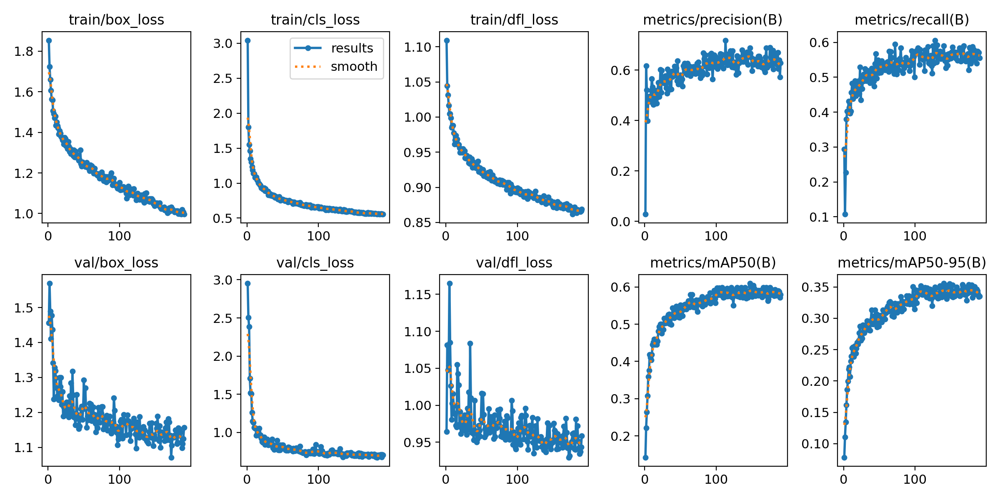)


Metric from training process (with hyperparameter tuning)

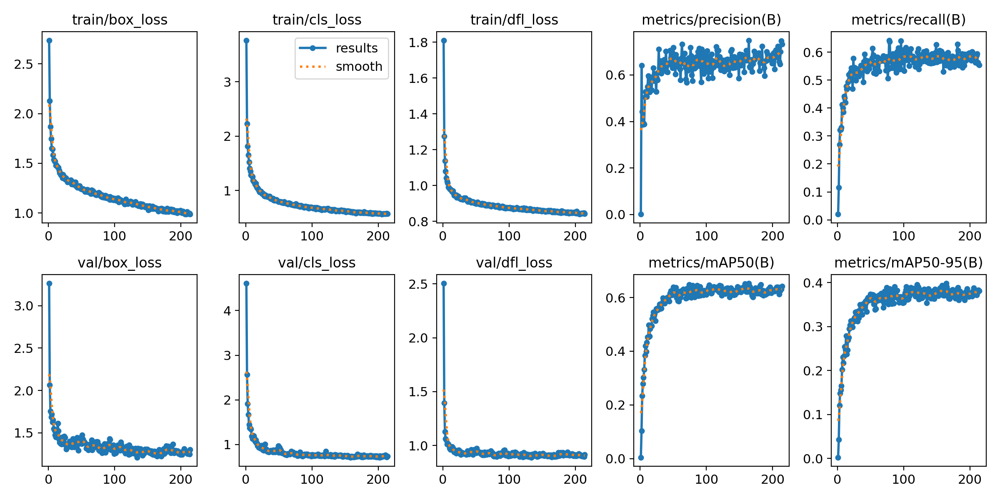

In [9]:
model = YOLO(r"C:\Users\User\Desktop\DSO\traffic-prediction\backend\results\runs\detect\train24\weights\best.pt")
model.fuse()

Model summary (fused): 168 layers, 3006428 parameters, 0 gradients, 8.1 GFLOPs



0: 480x640 1 truck, 18.0ms
Speed: 2.1ms preprocess, 18.0ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)


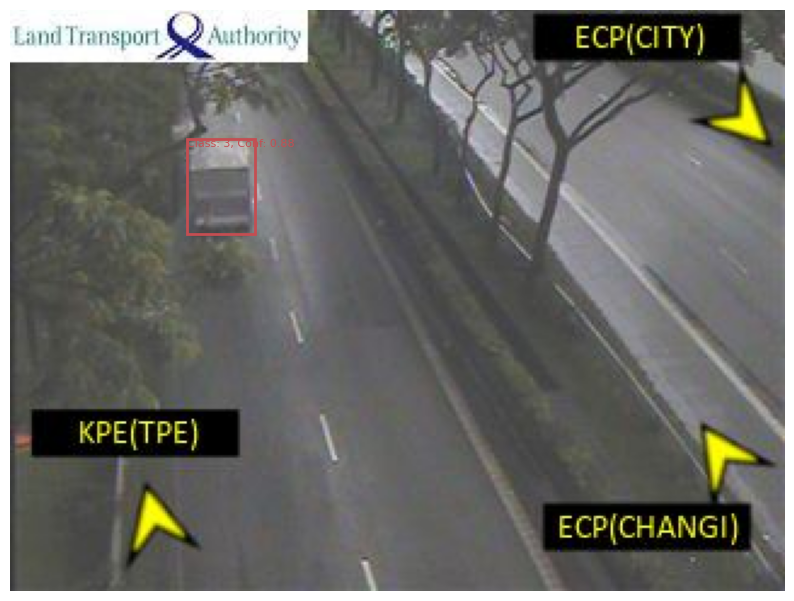


0: 480x640 2 cars, 18.6ms
Speed: 3.0ms preprocess, 18.6ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


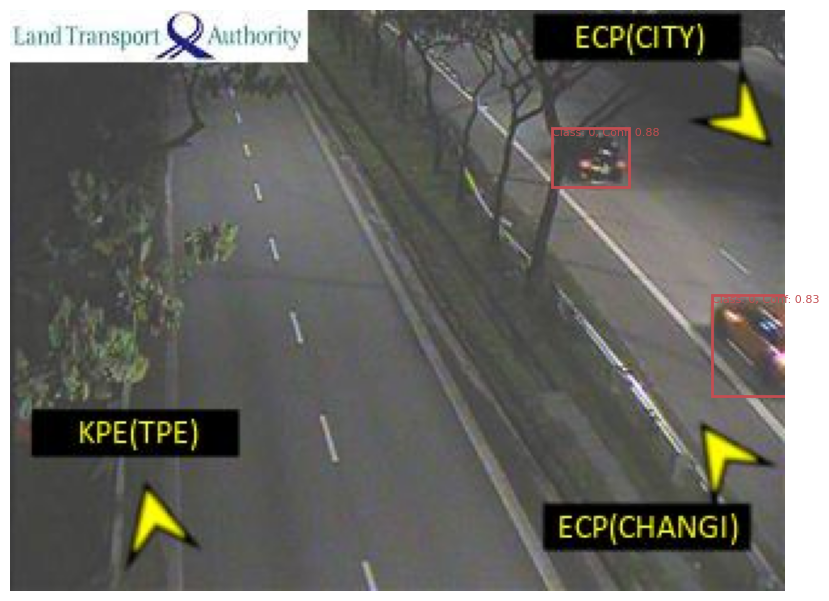


0: 480x640 4 cars, 23.8ms
Speed: 2.0ms preprocess, 23.8ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


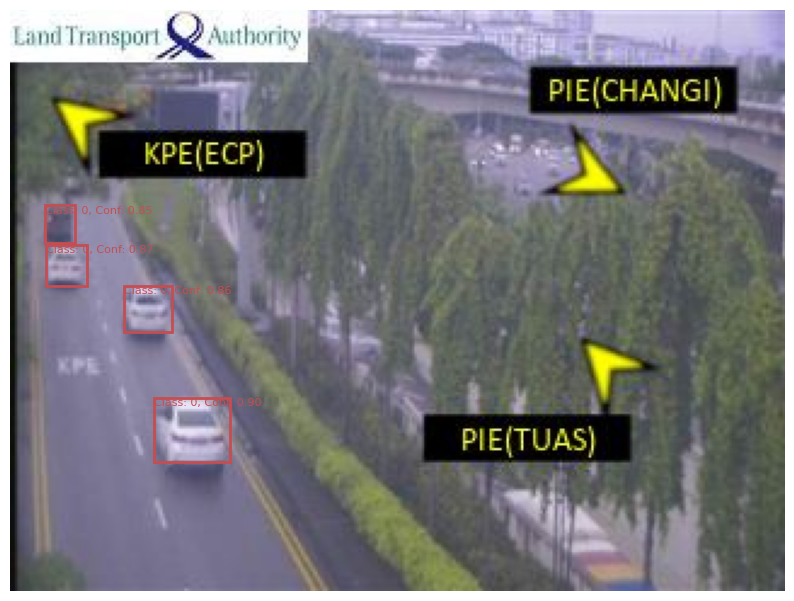


0: 480x640 2 cars, 33.2ms
Speed: 5.0ms preprocess, 33.2ms inference, 8.0ms postprocess per image at shape (1, 3, 480, 640)


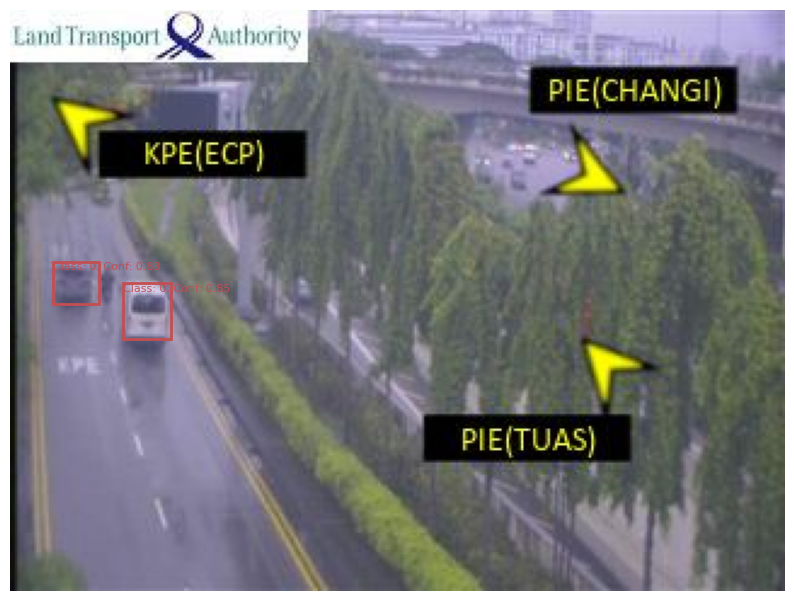


0: 480x640 1 car, 63.5ms
Speed: 2.4ms preprocess, 63.5ms inference, 5.0ms postprocess per image at shape (1, 3, 480, 640)


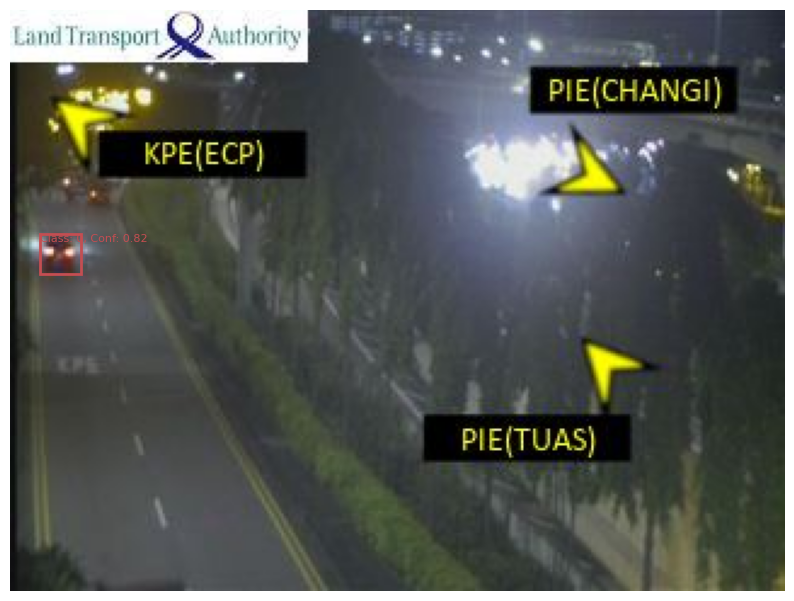


0: 480x640 2 cars, 27.6ms
Speed: 2.0ms preprocess, 27.6ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


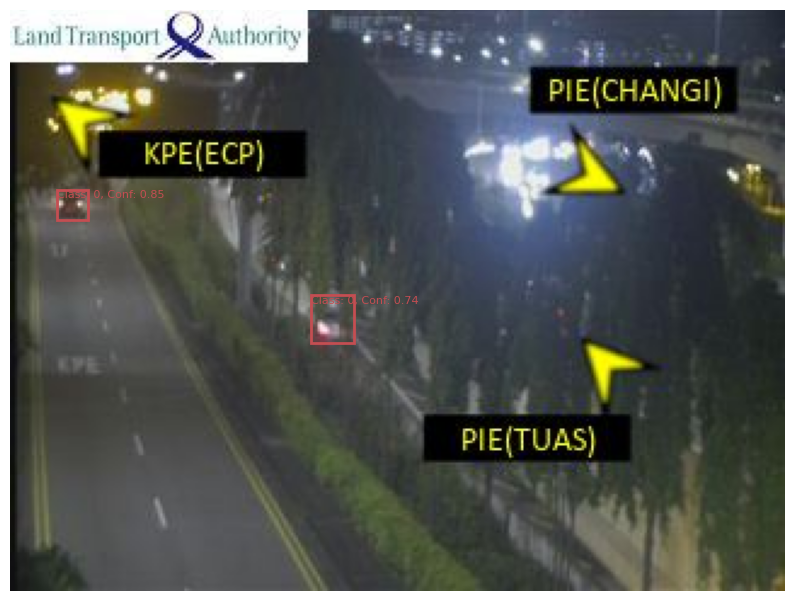


0: 480x640 1 car, 18.5ms
Speed: 7.5ms preprocess, 18.5ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


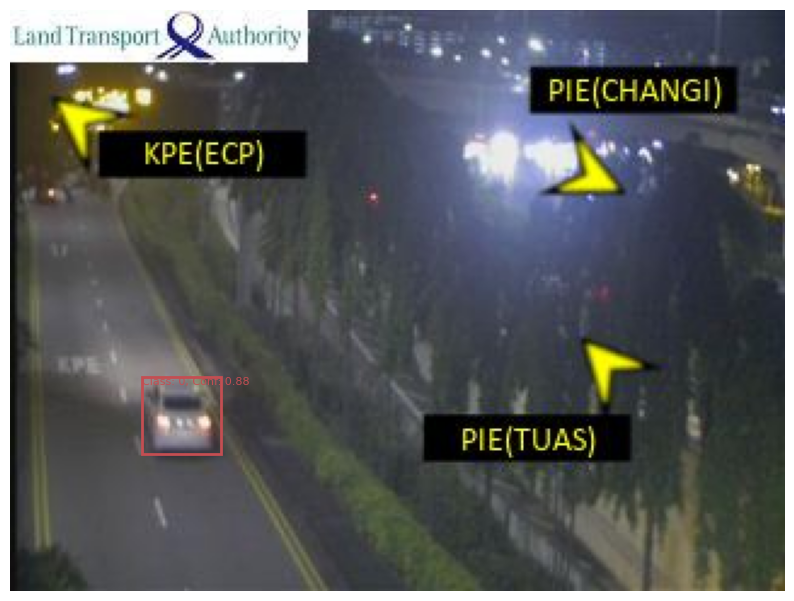


0: 480x640 7 cars, 1 motorcycle, 1 truck, 15.5ms
Speed: 3.0ms preprocess, 15.5ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


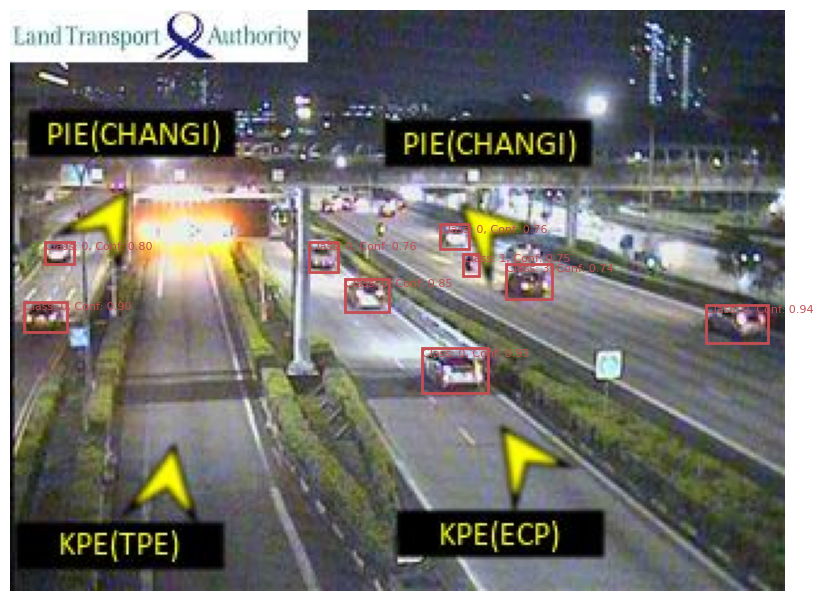


0: 480x640 5 cars, 20.9ms
Speed: 2.0ms preprocess, 20.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


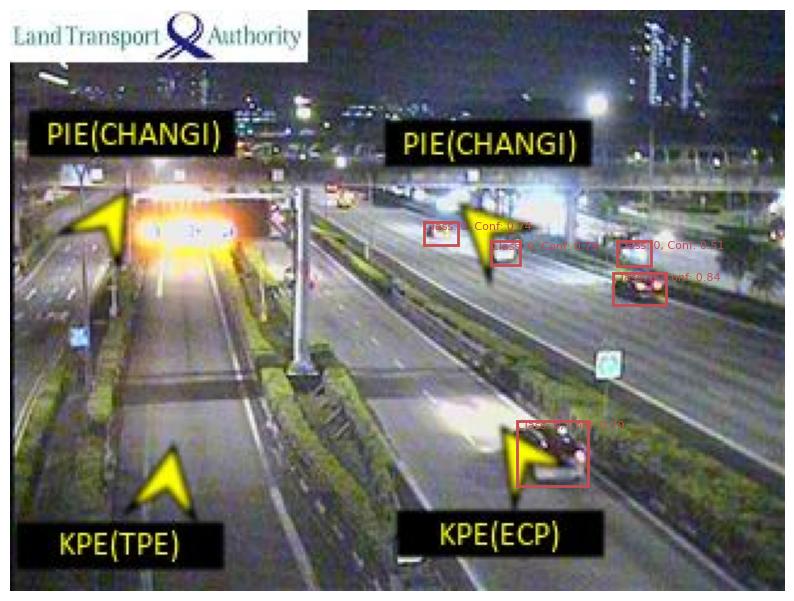


0: 480x640 6 cars, 1 motorcycle, 2 trucks, 17.5ms
Speed: 3.5ms preprocess, 17.5ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)


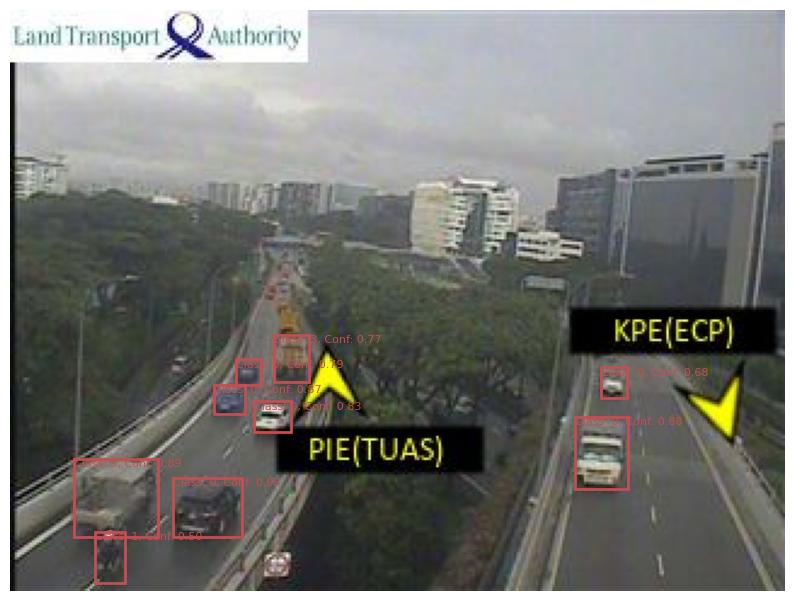

In [12]:
# Directory of images
image_dir = r"C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\images\test"

# Get list of image files
image_files = [file for file in os.listdir(image_dir) if file.endswith(".jpg") or file.endswith(".png")]

# Predict and plot bounding boxes for each image
for image_file in image_files[:10]:
    # Read image
    image_path = os.path.join(image_dir, image_file)
    image = cv2.imread(image_path)

    # Perform object detection
    results = model.predict(image, conf=0.5, iou=0.5)

    # Create a single figure for each image
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis("off")

    for result in results:
        # Get bounding box coordinates and class labels
        boxes = result.boxes.xywh.cpu().numpy()
        class_labels = result.boxes.cls.cpu().numpy().astype(int)
        conf_scores = result.boxes.conf.cpu().numpy()

        for box, class_label, conf_score in zip(boxes, class_labels, conf_scores):
            x, y, w, h = box[0], box[1], box[2], box[3]
            label = f"Class: {class_label}, Conf: {conf_score:.2f}"
            
            # Draw bounding box on the image
            rectangle = Rectangle((x-w/2, y-h/2), w, h, linewidth=2, edgecolor='r', facecolor='none')
            plt.gca().add_patch(rectangle)
            plt.text(x - w/2, y - h/2, label, fontsize=8, color='r', verticalalignment='top')

    # Show image with all bounding boxes
    plt.show()


In [2]:
def roi(img, coords):
    x = int(img.shape[1])
    y = int(img.shape[0])
    if len(coords) < 4:
        print("minimum 4 coordinates required")
        return
    shape = np.array(coords)  # Shape of roi
    mask = np.zeros_like(img)  # np array with zeros (of image dimension)

    # Creates a polygon with the mask colour (blue), areas not in roi would be black (pixel is 0)
    cv2.fillPoly(mask, pts=np.int32([shape]), color=(255, 255, 255))

    # Select areas where mask pixels are not zero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def plot_rois(images_dir, image_roi_df, num=5):
    for img_file in os.listdir(images_dir):
        if num == 0:
            break
        num -= 1
        if img_file.endswith(".jpg") or img_file.endswith(".png"):
            camera_id = int(img_file.split("_")[0])
            img_path = os.path.join(images_dir, img_file)
            img = cv2.imread(img_path)
            rois = image_roi_df[image_roi_df.Camera_Id == camera_id]
            for i in range(len(rois)):
                roi_coords = ast.literal_eval(rois.iloc[i, 1])
                roi_img = roi(img, roi_coords)

                # Plot the original image and ROI image side by side
                fig, axes = plt.subplots(1, 2, figsize=(12, 6))
                
                axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
                axes[0].set_title("Original Image")
                axes[0].axis('off')

                axes[1].imshow(cv2.cvtColor(roi_img, cv2.COLOR_BGR2RGB))
                axes[1].set_title("Image with Regions of Interest (ROIs)")
                axes[1].axis('off')

                plt.show()

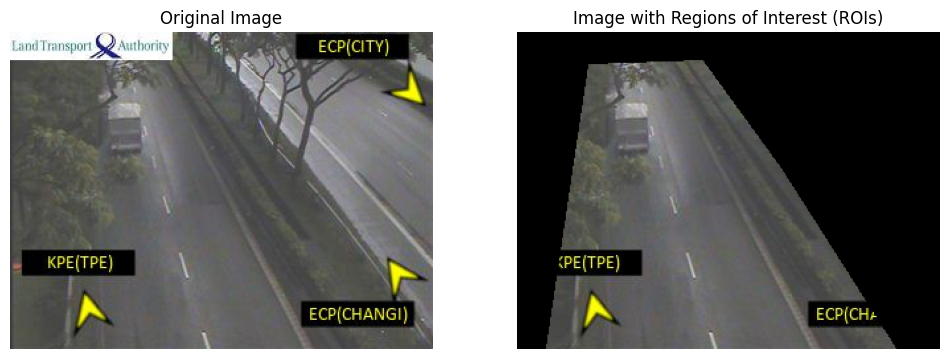

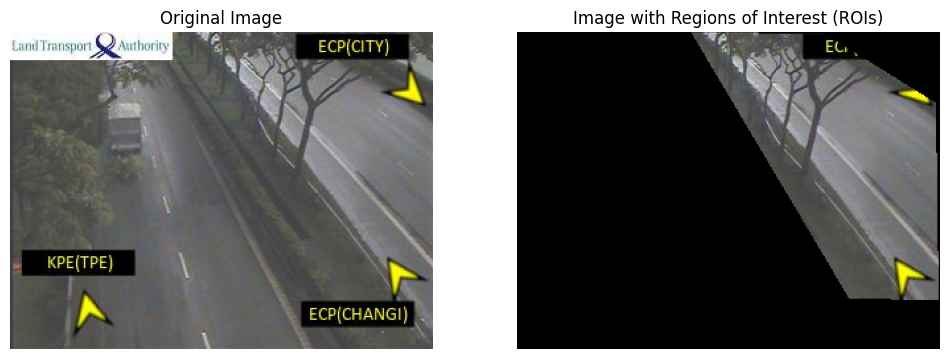

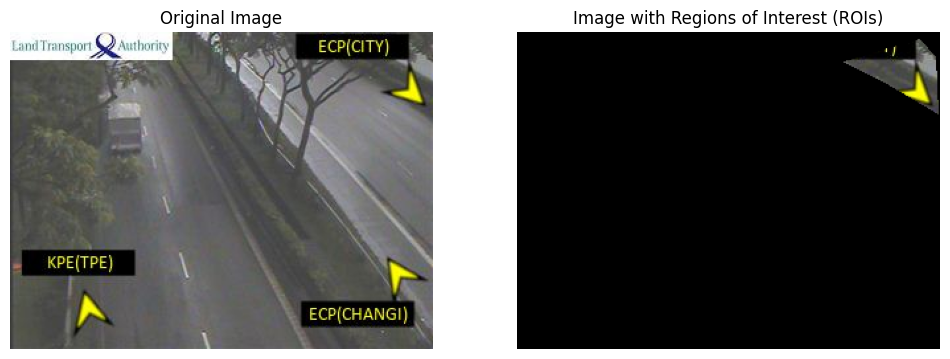

In [4]:
image_roi_df = pd.read_csv(r'C:\Users\User\Desktop\DSO\traffic-prediction\backend\image-processing\roi_masks.csv')
images_dir = r'C:\Users\User\Desktop\DSO\traffic-prediction\backend\data\images\test'
plot_rois(images_dir, image_roi_df, num=1)